### This notebook aims to analyze the epigenetic profile of our two cohorts, only comparing HSC-labelled cells. 

In [43]:
# Setup
library(ArchR)
set.seed(1)
threads <- parallel::detectCores() - 1
addArchRThreads(threads = threads)
addArchRLocking(FALSE)
addArchRGenome("hg38")

Input threads is equal to or greater than ncores minus 1 (63)
Setting cores to ncores minus 2. Set force = TRUE to set above this number!

Setting default number of Parallel threads to 62.

Setting ArchRLocking to FALSE.

Setting default genome to Hg38.



In [2]:
proj_hsc <- loadArchRProject("ArchR_HSC")
proj_hsc

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

class: ArchRProject 
outputDirectory: /work/project/ladcol_013/bt-atac/notebooks/1_processing/test/ArchR_HSC 
samples(5): collab_0 collab_1 granja_D8T1 granja_D9T1 granja_D7T1
sampleColData names(1): ArrowFiles
cellColData names(25): Sample TSSEnrichment ... CellType_Unified
  Sample_CellType
numberOfCells(1): 5064
medianTSS(1): 14.2005
medianFrags(1): 20510.5

In [3]:
getCellColData(proj_hsc)

DataFrame with 5064 rows and 25 columns
                                    Sample TSSEnrichment ReadsInTSS
                               <character>     <numeric>  <numeric>
granja_D7T1#TTACGGACATGTGAGG-1 granja_D7T1        13.246      14830
granja_D7T1#ACGTTAGAGTATACCC-1 granja_D7T1        15.814      18719
granja_D7T1#GTGCTGGGTTCTTTGT-1 granja_D7T1        17.455      15117
granja_D7T1#GCCTACTTCCTTCGAC-1 granja_D7T1        14.983      11539
granja_D7T1#TTGAGCACATGTGGGA-1 granja_D7T1        16.215      14518
...                                    ...           ...        ...
granja_D9T1#TAGTCCCCATAGATAG-1 granja_D9T1        14.870       1194
granja_D9T1#ACTATTCGTTTGGATC-1 granja_D9T1        17.305       1372
granja_D9T1#GCATTGAGTTACGGAG-1 granja_D9T1        13.817       1242
granja_D9T1#GGAATCTAGCGAGAAA-1 granja_D9T1        15.487       1134
granja_D9T1#ACCTGCTAGGATTTGA-1 granja_D9T1        21.273       1128
                               ReadsInPromoter ReadsInBlacklist PromoterRati


Attache Paket: ‘dplyr’


Das folgende Objekt ist maskiert ‘package:Biobase’:

    combine


Die folgenden Objekte sind maskiert von ‘package:GenomicRanges’:

    intersect, setdiff, union


Das folgende Objekt ist maskiert ‘package:GenomeInfoDb’:

    intersect


Die folgenden Objekte sind maskiert von ‘package:IRanges’:

    collapse, desc, intersect, setdiff, slice, union


Die folgenden Objekte sind maskiert von ‘package:S4Vectors’:

    first, intersect, rename, setdiff, setequal, union


Die folgenden Objekte sind maskiert von ‘package:BiocGenerics’:

    combine, intersect, setdiff, union


Das folgende Objekt ist maskiert ‘package:matrixStats’:

    count


Die folgenden Objekte sind maskiert von ‘package:data.table’:

    between, first, last


Die folgenden Objekte sind maskiert von ‘package:plyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize


Das folgende Objekt ist maskiert ‘package:gridExtra’:

    combine


Die folgenden Objekte sind 

DataFrame with 6 rows and 26 columns
                                    Sample TSSEnrichment ReadsInTSS
                                     <Rle>       <array>    <array>
granja_D7T1#TTACGGACATGTGAGG-1 granja_D7T1        13.246      14830
granja_D7T1#ACGTTAGAGTATACCC-1 granja_D7T1        15.814      18719
granja_D7T1#GTGCTGGGTTCTTTGT-1 granja_D7T1        17.455      15117
granja_D7T1#GCCTACTTCCTTCGAC-1 granja_D7T1        14.983      11539
granja_D7T1#TTGAGCACATGTGGGA-1 granja_D7T1        16.215      14518
granja_D7T1#AACCAACTCAGAATGA-1 granja_D7T1         14.02      15074
                               ReadsInPromoter ReadsInBlacklist
                                       <array>          <array>
granja_D7T1#TTACGGACATGTGAGG-1           15036              381
granja_D7T1#ACGTTAGAGTATACCC-1           19448              453
granja_D7T1#GTGCTGGGTTCTTTGT-1           14485              406
granja_D7T1#GCCTACTTCCTTCGAC-1           11574              386
granja_D7T1#TTGAGCACATGTGGGA-1     

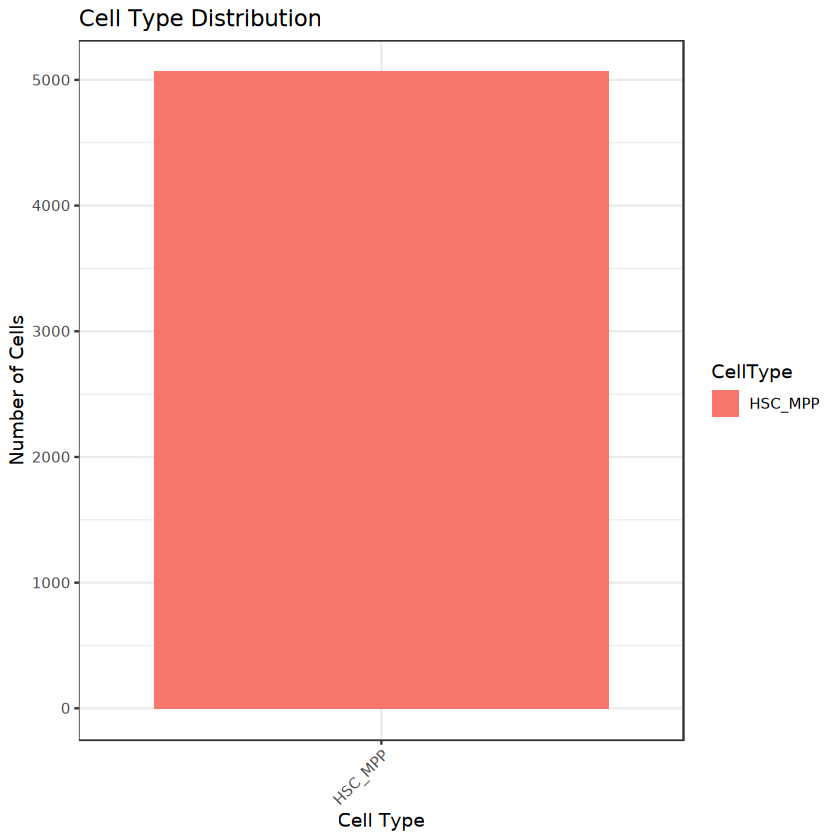

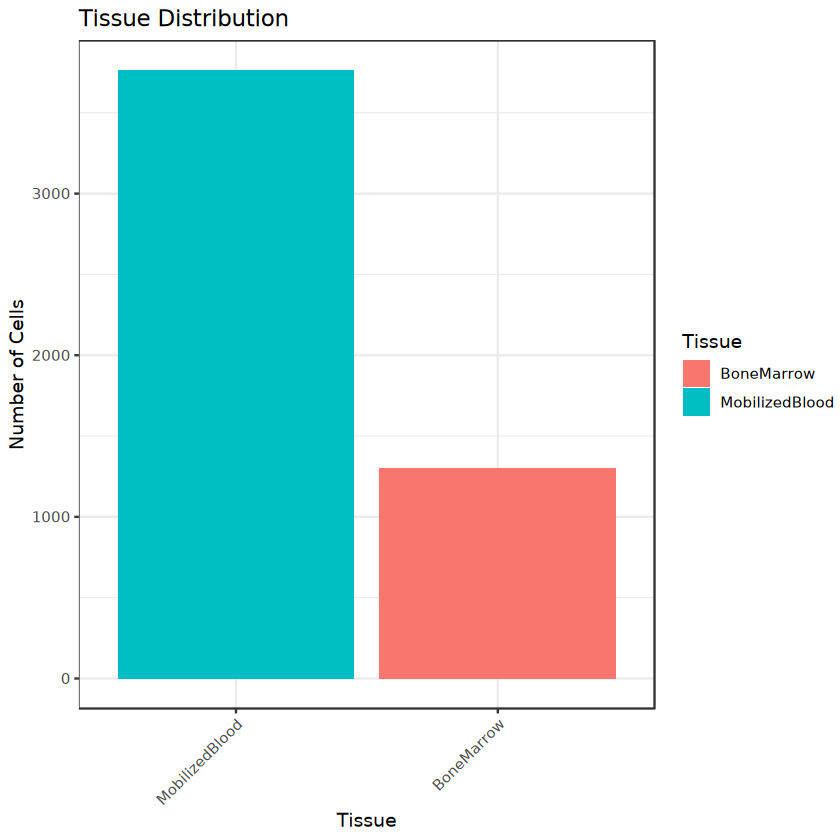

In [26]:
library(ArchR)
library(ggplot2)
library(dplyr)

head(proj_hsc@cellColData)

# Barplot for CellType distribution
df_celltype <- data.frame(CellType = proj_hsc$CellType_Unified) %>%
  count(CellType)

ggplot(df_celltype, aes(x = reorder(CellType, -n), y = n, fill = CellType)) +
  geom_bar(stat = "identity") +
  labs(title = "Cell Type Distribution",
       x = "Cell Type",
       y = "Number of Cells") +
  theme_bw() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

# Barplot for Tissue distribution
df_tissue <- data.frame(Tissue = proj_hsc$Tissue) %>%
  count(Tissue)

ggplot(df_tissue, aes(x = reorder(Tissue, -n), y = n, fill = Tissue)) +
  geom_bar(stat = "identity") +
  labs(title = "Tissue Distribution",
       x = "Tissue",
       y = "Number of Cells") +
  theme_bw() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))


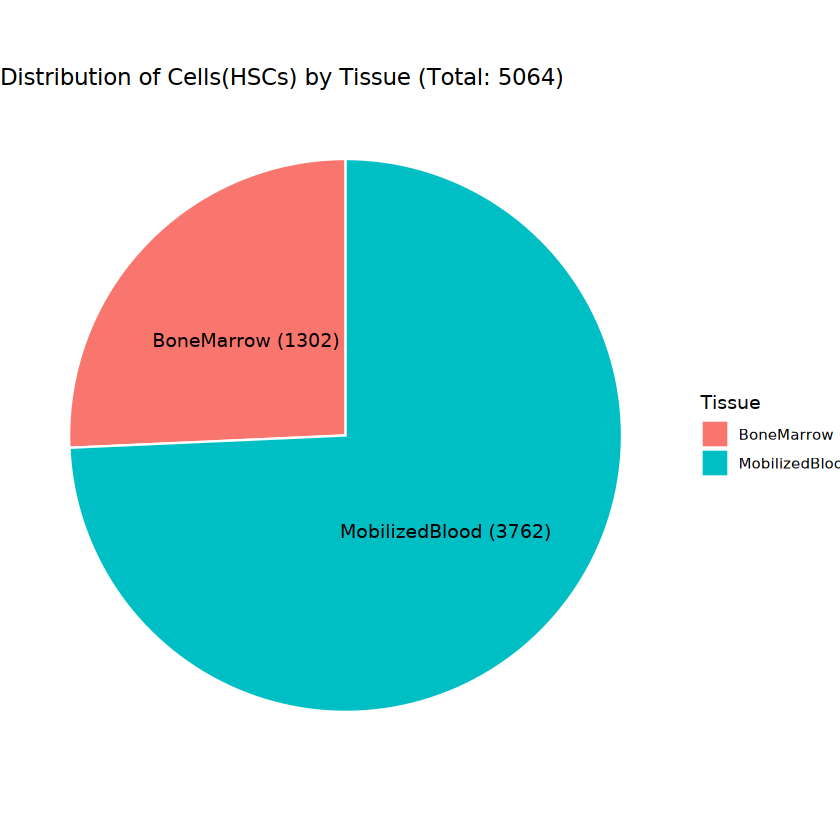

In [30]:
df_tissue <- data.frame(Tissue = proj_hsc$Tissue) %>%
  count(Tissue) %>%
  mutate(Freq = n / sum(n))

total_cells <- sum(df_tissue$n)

ggplot(df_tissue, aes(x = "", y = Freq, fill = Tissue)) +
  geom_col(width = 1, color = "white") +
  coord_polar(theta = "y") +
  geom_text(aes(label = paste0(Tissue, " (", n, ")")),
            position = position_stack(vjust = 0.5)) +
  labs(title = paste0("Distribution of Cells(HSCs) by Tissue (Total: ", total_cells, ")")) +
  theme_void()

In [5]:
proj_hsc <- addIterativeLSI(
  ArchRProj    = proj_hsc,
  useMatrix    = "PeakMatrix",
  name         = "PeakLSI",
  iterations   = 2,
  dimsToUse     = 1:30,
  force        = TRUE   
)

Checking Inputs...

ArchR logging to : ArchRLogs/ArchR-addIterativeLSI-e736253b3eb6-Date-2025-09-01_Time-00-13-09.375315.log
If there is an issue, please report to github with logFile!

2025-09-01 00:13:18.005952 : Computing Total Across All Features, 0.11 mins elapsed.

2025-09-01 00:13:28.967295 : Computing Top Features, 0.293 mins elapsed.

###########
2025-09-01 00:13:31.990587 : Running LSI (1 of 2) on Top Features, 0.344 mins elapsed.
###########

2025-09-01 00:13:32.042341 : Creating Partial Matrix, 0.344 mins elapsed.

2025-09-01 00:14:36.503191 : Computing LSI, 1.419 mins elapsed.

2025-09-01 00:17:44.986881 : Identifying Clusters, 4.56 mins elapsed.

Warning message:
“Data is of class matrix. Coercing to dgCMatrix.”
2025-09-01 00:18:02.60746 : Identified 6 Clusters, 4.854 mins elapsed.

2025-09-01 00:18:02.660174 : Saving LSI Iteration, 4.855 mins elapsed.

2025-09-01 00:18:41.998386 : Creating Cluster Matrix on the total Group Features, 5.51 mins elapsed.

2025-09-01 00:19:1

In [6]:
proj_hsc <- addUMAP(
  ArchRProj  = proj_hsc,
  reducedDims  = "PeakLSI",
  name       = "UMAP_Peaks",
  dimsToUse  = 1:30
)

00:21:49 UMAP embedding parameters a = 0.7669 b = 1.223

00:21:49 Read 5064 rows and found 30 numeric columns

00:21:49 Using Annoy for neighbor search, n_neighbors = 40

00:21:49 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

00:21:50 Writing NN index file to temp file /tmp/RtmpIAKoA6/filee736481390b3

00:21:50 Searching Annoy index using 32 threads, search_k = 4000

00:21:50 Annoy recall = 100%

00:21:52 Commencing smooth kNN distance calibration using 32 threads
 with target n_neighbors = 40

00:21:54 Initializing from normalized Laplacian + noise (using RSpectra)

00:21:54 Commencing optimization for 500 epochs, with 310418 positive edges

00:21:54 Using rng type: pcg

00:22:27 Optimization finished

00:22:27 Creating temp model dir /tmp/RtmpIAKoA6/dire736beaf0dc


Warning message:
“HarmonyMatrix is deprecated and will be removed in the future from the API in the future”
Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony converged after 3 iterations

08:40:53 UMAP embedding parameters a = 0.7669 b = 1.223

08:40:53 Read 5064 rows and found 30 numeric columns

08:40:53 Using Annoy for neighbor search, n_neighbors = 40

08:40:53 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

08:40:55 Writing NN index file to temp file /tmp/RtmpIAKoA6/filee73637f08bcd

08:40:55 Searching Annoy index using 32 threads, search_k = 4000

08:40:55 Annoy recall = 100%

08:40:57 Commencing smooth kNN distance calibration using 32 threads
 with target n_neighbors = 40

08:41

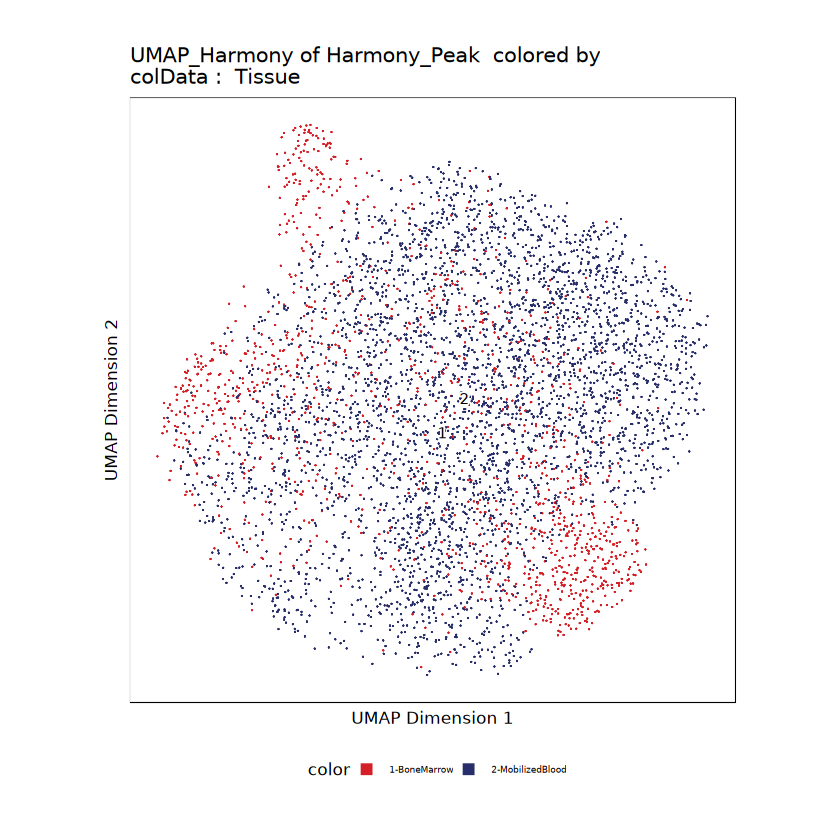

In [20]:
# UMAP distribution

proj_hsc <- addHarmony(
  ArchRProj    = proj_hsc,
  reducedDims  = "PeakLSI",
  name         = "Harmony_Peak",
  groupBy      = "Sample",
  force        = TRUE
)

# UMAP of Harmony‐corrected space
proj_hsc <- addUMAP(
  ArchRProj   = proj_hsc,
  reducedDims   = "Harmony_Peak",
  name        = "UMAP_Harmony",
    force        = TRUE
)

# Plot
plotEmbedding(
  ArchRProj = proj_hsc,
  embedding = "UMAP_Harmony",
  colorBy   = "cellColData",
  name      = "Tissue",
    force        = TRUE
)

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e73638723d4a-Date-2025-09-01_Time-08-41-31.848296.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e73638723d4a-Date-2025-09-01_Time-08-41-31.848296.log



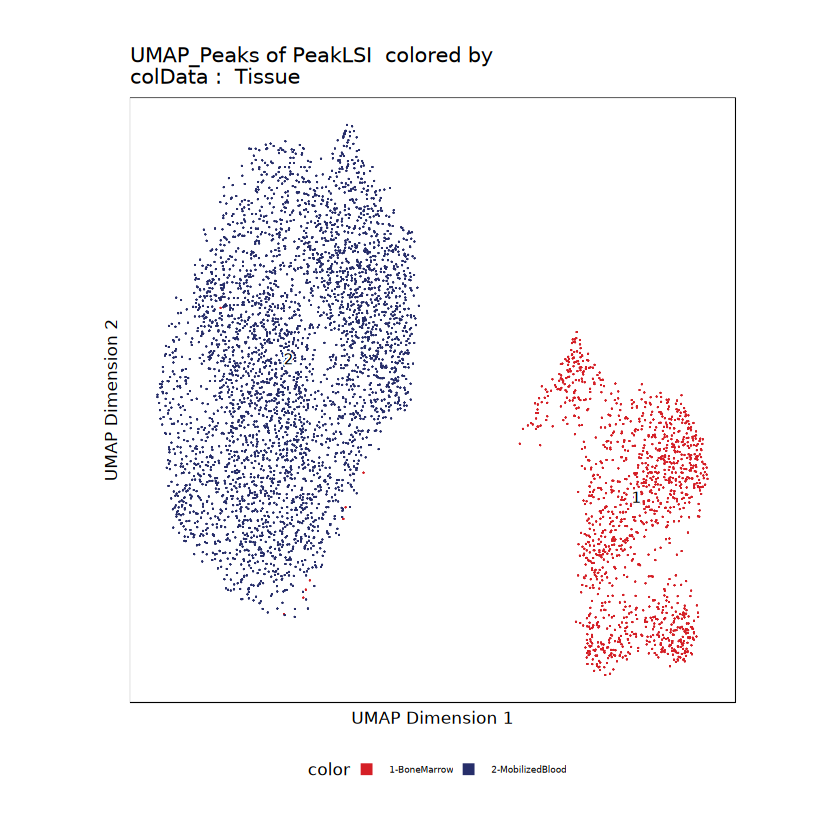

In [21]:
plotEmbedding(
  ArchRProj = proj_hsc,
  embedding = "UMAP_Peaks",
  colorBy   = "cellColData",
  name      = "Tissue"
)

ArchR logging to : ArchRLogs/ArchR-addClusters-e7361a256cbc-Date-2025-09-01_Time-08-41-35.435115.log
If there is an issue, please report to github with logFile!

Overriding previous entry for Clusters_Harmony

2025-09-01 08:41:36.179813 : Running Seurats FindClusters (Stuart et al. Cell 2019), 0.003 mins elapsed.

Warning message:
“Data is of class matrix. Coercing to dgCMatrix.”
Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 5064
Number of edges: 174778

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7095
Number of communities: 8
Elapsed time: 0 seconds


2025-09-01 08:41:46.240354 : Testing Outlier Clusters, 0.171 mins elapsed.

2025-09-01 08:41:46.247549 : Assigning Cluster Names to 8 Clusters, 0.171 mins elapsed.

2025-09-01 08:41:46.344061 : Finished addClusters, 0.172 mins elapsed.

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e736339e0135-Date-2025-09-01_Time-08-41-46.355922.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e736339e0135-Date-2025-09-01_Time-08-41-46.355922.log



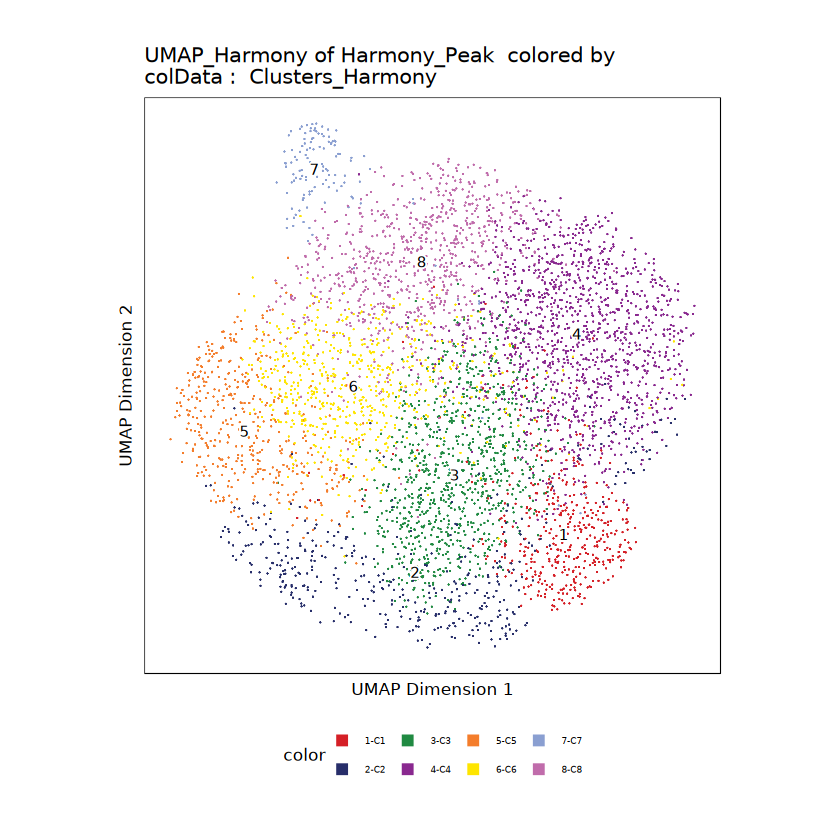

In [22]:
proj_hsc <- addClusters(
  proj_hsc,
  reducedDims  = "Harmony_Peak",
  name         = "Clusters_Harmony",
  force        = TRUE
)

plotEmbedding(
  ArchRProj = proj_hsc,
  embedding = "UMAP_Harmony",
  colorBy   = "cellColData",
  name      = "Clusters_Harmony"
)

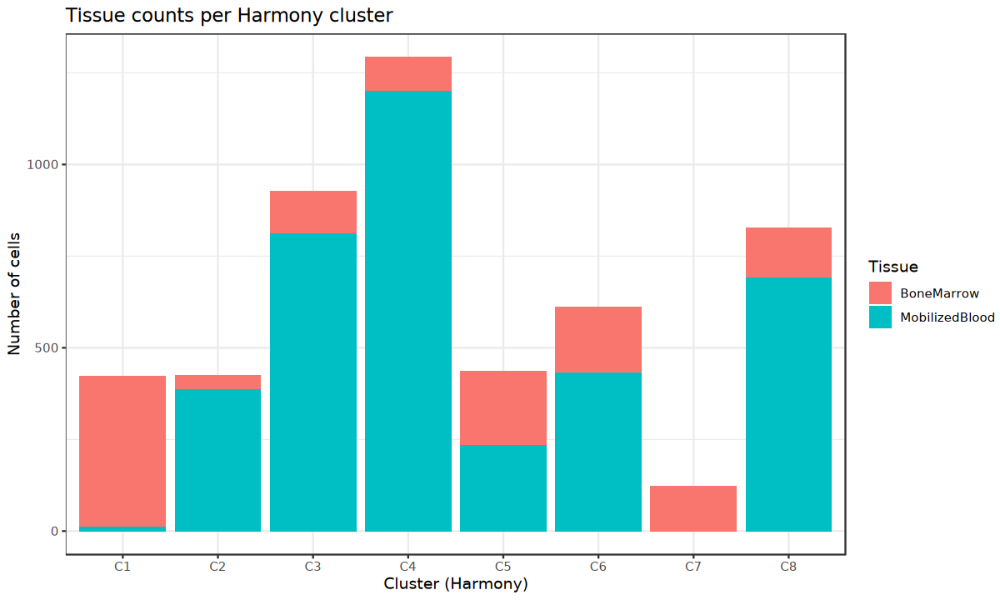

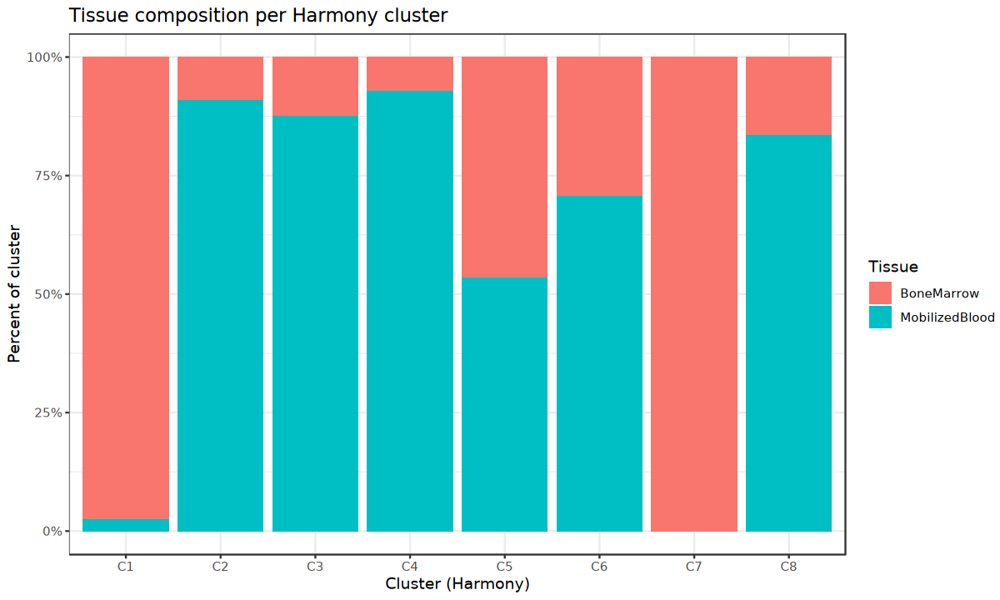

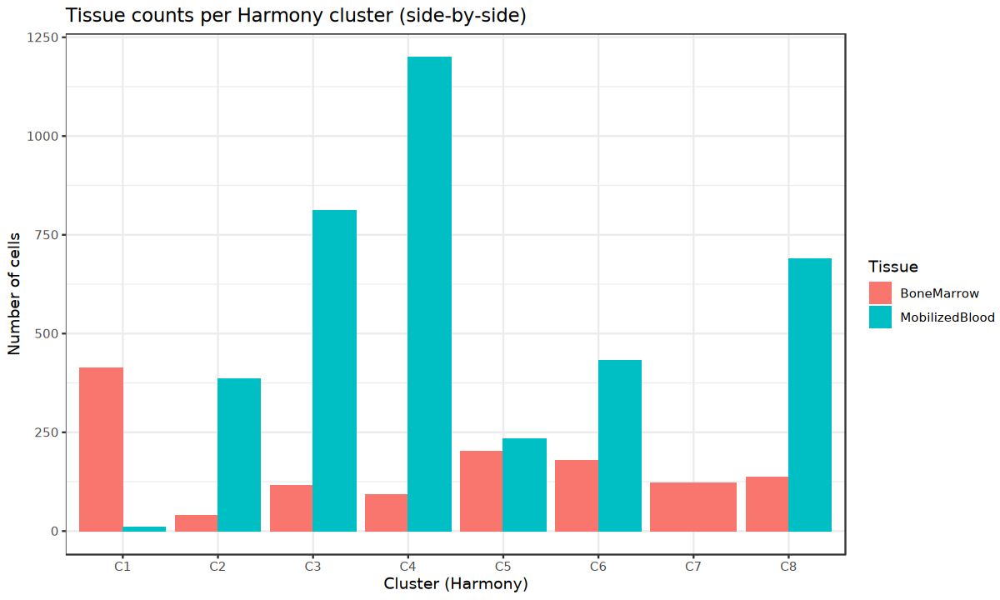

In [32]:
options(repr.plot.width = 10, repr.plot.height = 6) 

# Summarize Tissue × Cluster counts
df_ct <- data.frame(
  Cluster = proj_hsc$Clusters_Harmony,
  Tissue  = proj_hsc$Tissue
) %>%
  filter(!is.na(Cluster), !is.na(Tissue)) %>%
  count(Cluster, Tissue) %>%
  group_by(Cluster) %>%
  mutate(cluster_total = sum(n),
         pct = n / cluster_total) %>%
  ungroup()

# Absolute stacked bars 
ggplot(df_ct, aes(x = Cluster, y = n, fill = Tissue)) +
  geom_col() +
  labs(title = "Tissue counts per Harmony cluster",
       x = "Cluster (Harmony)",
       y = "Number of cells") +
  theme_bw()

# 100% stacked bars (composition)
ggplot(df_ct, aes(x = Cluster, y = pct, fill = Tissue)) +
  geom_col() +
  scale_y_continuous(labels = function(x) paste0(x * 100, "%")) +
  labs(title = "Tissue composition per Harmony cluster",
       x = "Cluster (Harmony)",
       y = "Percent of cluster") +
  theme_bw()

# side-by-side bars
ggplot(df_ct, aes(x = Cluster, y = n, fill = Tissue)) +
  geom_col(position = "dodge") +
  labs(title = "Tissue counts per Harmony cluster (side-by-side)",
       x = "Cluster (Harmony)",
       y = "Number of cells") +
  theme_bw()

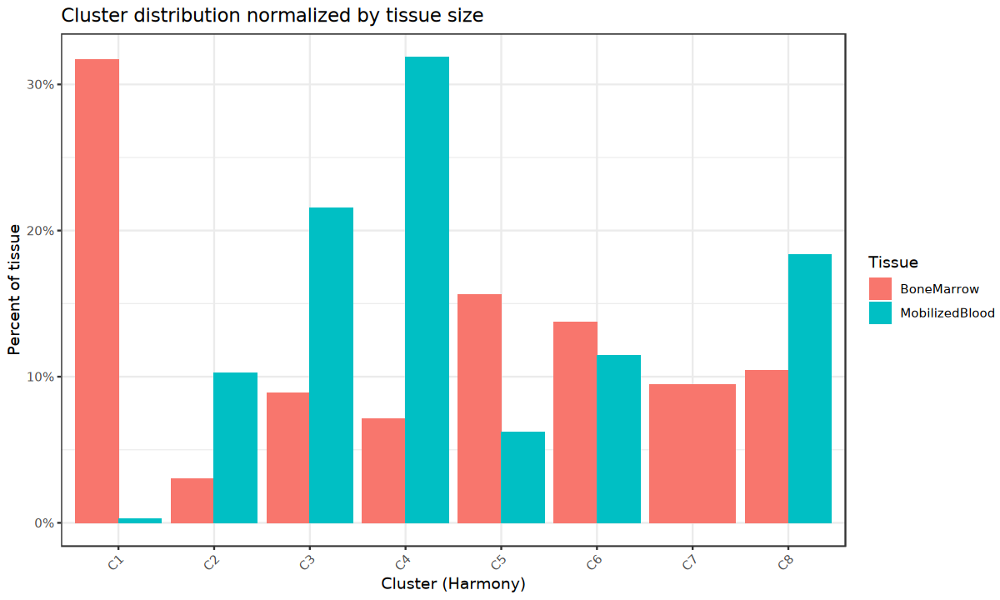

In [33]:
df_ct <- data.frame(
  Cluster = proj_hsc$Clusters_Harmony,
  Tissue  = proj_hsc$Tissue
) %>%
  filter(!is.na(Cluster), !is.na(Tissue)) %>%
  count(Tissue, Cluster) %>%
  group_by(Tissue) %>%
  mutate(tissue_total = sum(n),
         pct = n / tissue_total) %>%
  ungroup()

# distribution across clusters per tissue
ggplot(df_ct, aes(x = Cluster, y = pct, fill = Tissue)) +
  geom_col(position = "dodge") +
  scale_y_continuous(labels = function(x) paste0(x * 100, "%")) +
  labs(title = "Cluster distribution normalized by tissue size",
       x = "Cluster (Harmony)",
       y = "Percent of tissue") +
  theme_bw() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

                
                   C1   C2   C3   C4   C5   C6   C7   C8
  BoneMarrow      413   39  116   93  203  179  123  136
  MobilizedBlood   10  386  811 1200  233  432    0  690

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e73668e79fbe-Date-2025-09-02_Time-10-17-39.1641.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e73668e79fbe-Date-2025-09-02_Time-10-17-39.1641.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e7363b79678b-Date-2025-09-02_Time-10-17-55.035776.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e7363b79678b-Date-2025-09-02_Time-10-17-55.035776.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e73661ecb8b7-Date-2025-09-02_Time-10-17-57.109746.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e73661

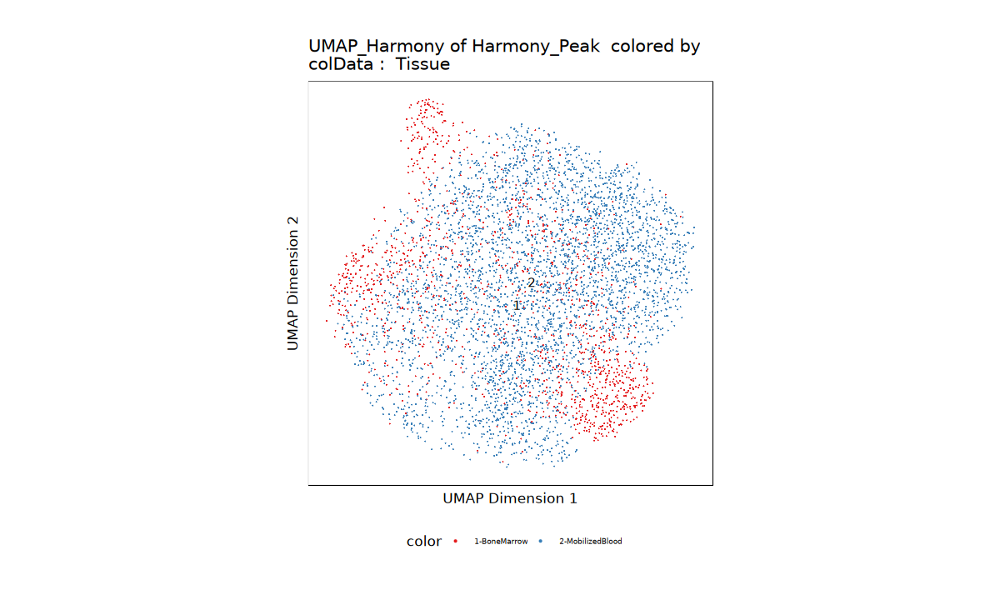

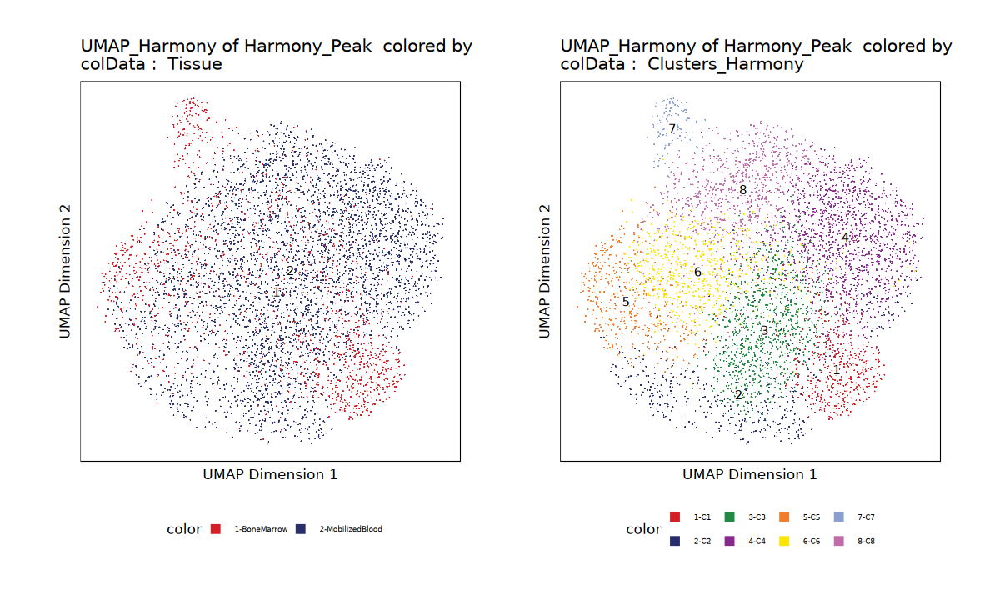

In [34]:
# Distribution of cells across tissues and clusters
table(proj_hsc$Tissue, proj_hsc$Clusters_Harmony)

# Tissue distribution on UMAP
plotEmbedding(
  ArchRProj = proj_hsc,
  embedding = "UMAP_Harmony",
  colorBy   = "cellColData",
  name      = "Tissue",
  pal = c("BoneMarrow" = "#E41A1C", "MobilizedBlood" = "#377EB8")
)

# Create a combined plot to see both tissue and clusters
p1 <- plotEmbedding(proj_hsc, embedding = "UMAP_Harmony", 
                    colorBy = "cellColData", name = "Tissue")
p2 <- plotEmbedding(proj_hsc, embedding = "UMAP_Harmony", 
                    colorBy = "cellColData", name = "Clusters_Harmony")
ggAlignPlots(p1, p2, type = "h")

In [10]:
# Marker peaks – collab vs granja in HSCs 
markerPeaks <- getMarkerFeatures(
  ArchRProj  = proj_hsc,
  useMatrix  = "PeakMatrix",
  groupBy    = "Tissue",
  testMethod = "wilcoxon",
  bias       = c("TSSEnrichment","log10(nFrags)"),
  useGroups  = "BoneMarrow",
  bgdGroups  = "MobilizedBlood"
)

# GRanges of significant peaks
bmPeaks <- getMarkers(
  markerPeaks,
  cutOff   = "FDR <= 0.05 & Log2FC >= 1",
  returnGR = TRUE
)$BoneMarrow

mbPeaks <- getMarkers(
  markerPeaks,
  cutOff   = "FDR <= 0.05 & Log2FC <= -1",
  returnGR = TRUE
)$MobilizedBlood

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-e7367c61d779-Date-2025-09-01_Time-00-23-59.061432.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

2025-09-01 00:24:01.249737 : Matching Known Biases, 0.02 mins elapsed.

2025-09-01 00:24:06.601797 : Computing Pairwise Tests (1 of 1), 0.11 mins elapsed.

Pairwise Test BoneMarrow : Seqnames chr1

Pairwise Test BoneMarrow : Seqnames chr10

Pairwise Test BoneMarrow : Seqnames chr11

Pairwise Test BoneMarrow : Seqnames chr12

Pairwise Test BoneMarrow : Seqnames chr13

Pairwise Test BoneMarrow : Seqnames chr14

Pairwise Test BoneMarrow : Seqnames chr15

Pairwise Test BoneMarrow : Seqnames chr16

Pairwise Test BoneMarrow : Seqnames chr17

Pairwise Test BoneMarrow : Seqnames chr18

Pairwise Test BoneMarrow : Seqnames chr19

Pairwise Test BoneMarrow : Seqnames chr2

Pairwise Test BoneMarrow : Seqnames chr20

Pairwise Test BoneMarrow : Seqnames chr21

Pairwise Test BoneMarrow : Seqnames chr

In [11]:
# Motif annotations
proj_hsc <- addMotifAnnotations(
  ArchRProj = proj_hsc,
  motifSet   = "cisbp",
  name       = "Motifs",
    force=TRUE
)

# rebuild the PeakMatrix so it matches new PeakSet
proj_hsc <- addPeakMatrix(proj_hsc, force = TRUE)

# Enrichment of motifs in marker peaks 
proj_hsc <- addBgdPeaks(proj_hsc, force=TRUE)

ArchR logging to : ArchRLogs/ArchR-addMotifAnnotations-e736b2b339c-Date-2025-09-01_Time-00-27-42.781533.log
If there is an issue, please report to github with logFile!

2025-09-01 00:27:59.36231 : Getting Motif Set, Species : Homo sapiens, 0.021 mins elapsed.

Using version 2 motifs!

2025-09-01 00:28:13.763717 : Finding Motif Positions with motifmatchr!, 0.261 mins elapsed.

2025-09-01 00:42:56.218218 : All Motifs Overlap at least 1 peak!, 14.968 mins elapsed.

2025-09-01 00:42:56.24053 : Creating Motif Overlap Matrix, 14.969 mins elapsed.

2025-09-01 00:43:08.105728 : Finished Getting Motif Info!, 15.167 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-addMotifAnnotations-e736b2b339c-Date-2025-09-01_Time-00-27-42.781533.log

ArchR logging to : ArchRLogs/ArchR-addPeakMatrix-e7363cd93eef-Date-2025-09-01_Time-00-43-12.482387.log
If there is an issue, please report to github with logFile!

2025-09-01 00:43:14.083152 : Batch Execution w/ safelapply!, 0 mins elapsed.

Overridin

In [12]:
# Enrichment of motifs in marker peaks
# Enrichment test
motifEnr <- peakAnnoEnrichment(
  seMarker    = markerPeaks,
  ArchRProj   = proj_hsc,
  peakAnnotation = "Motif"
)

# Top motifs for each group
head(motifEnr$enrichment$BoneMarrow, 10)
head(motifEnr$enrichment$MobilizedBlood, 10)

# Heat-map of all enriched motifs
plotEnrichHeatmap(
  enrichment = motifEnr,
  n          = 20,
  transpose  = TRUE
)

# ChromVAR deviations + differential testing 
proj_hsc <- addDeviationsMatrix(
  ArchRProj      = proj_hsc,
  peakAnnotation = "Motifs",
  force          = TRUE
)

# Differential deviations test
diffDev <- differentialDeviations(
  ArchRProj  = proj_hsc,
  groupBy    = "Tissue",
  testMethod = "wilcoxon",
  useGroups  = "BoneMarrow",
  bgdGroups  = "MobilizedBlood"
)

# Top differential motifs by absolute z‐score
head(diffDev[ order(abs(diffDev$z), decreasing=TRUE), ], 20)


ArchR logging to : ArchRLogs/ArchR-peakAnnoEnrichment-e73672dcbd03-Date-2025-09-01_Time-00-48-54.786843.log
If there is an issue, please report to github with logFile!

2025-09-01 00:49:18.214503 : Computing Enrichments 1 of 1, 0.39 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-peakAnnoEnrichment-e73672dcbd03-Date-2025-09-01_Time-00-48-54.786843.log



NULL

NULL

ERROR: Error in plotEnrichHeatmap(enrichment = motifEnr, n = 20, transpose = TRUE): unbenutztes Argument (enrichment = motifEnr)


In [ ]:
# Heatmap of top enriched motifs 
library(ComplexHeatmap)

# top 20 motifs by enrichment
topMotifs <- rownames(motifEnr$BoneMarrow)[1:20]

# chromVAR deviation z‐scores per group
devMat <- getGroupMatrix(
  ArchRProj = proj_hsc,
  groupBy   = "Tissue",
  useMatrix = "MotifMatrix"
)

# subset & scale
hmDat <- scale(t(devMat[topMotifs, ]))

Heatmap(
  hmDat,
  name      = "z-score",
  cluster_rows = TRUE,
  cluster_columns = TRUE,
  column_title = "Tissue",
  row_title    = "Top Motifs"
)

In [71]:
# list every peakAnnotation currently stored
names(proj_hsc@peakAnnotation)

getPeakAnnotationNames <- names(proj_hsc@peakAnnotation)
getPeakAnnotationNames

[1] "Motif"

[1] "Motif"

Warning message:
“HarmonyMatrix is deprecated and will be removed in the future from the API in the future”
Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony converged after 3 iterations

08:39:42 UMAP embedding parameters a = 0.7669 b = 1.223

08:39:42 Read 5064 rows and found 30 numeric columns

08:39:42 Using Annoy for neighbor search, n_neighbors = 40

08:39:42 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

08:39:44 Writing NN index file to temp file /tmp/RtmpIAKoA6/filee7363509ffa8

08:39:44 Searching Annoy index using 32 threads, search_k = 4000

08:39:44 Annoy recall = 100%

08:39:46 Commencing smooth kNN distance calibration using 32 threads
 with target n_neighbors = 40

08:39

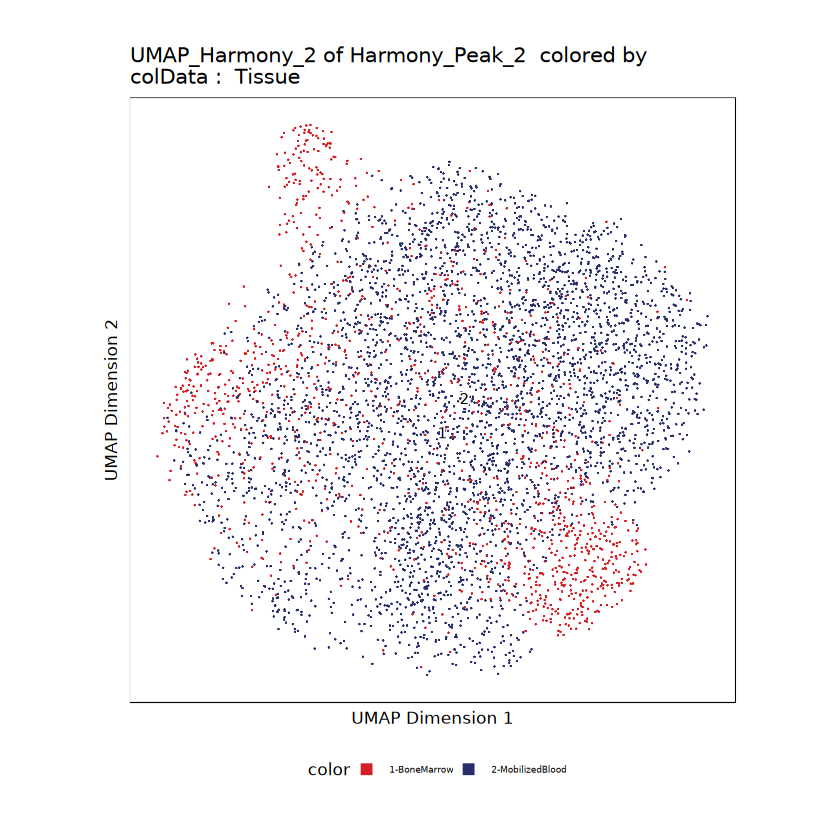

In [19]:
proj_hsc <- addHarmony(
  ArchRProj    = proj_hsc,
  reducedDims  = "PeakLSI",
  name         = "Harmony_Peak_2",
  groupBy      = "Sample",
  force        = TRUE
)

# UMAP on that Harmony‐corrected space
proj_hsc <- addUMAP(
  ArchRProj   = proj_hsc,
  reducedDims   = "Harmony_Peak_2",
  name        = "UMAP_Harmony_2",
    force = TRUE
)

plotEmbedding(
  ArchRProj = proj_hsc,
  embedding = "UMAP_Harmony_2",
  colorBy   = "cellColData",
  name      = "Tissue",
    force = TRUE
)

In [35]:
# Calculate tissue proportions for each cluster
cluster_tissue_comp <- table(proj_hsc$Clusters_Harmony, proj_hsc$Tissue)
cluster_tissue_prop <- prop.table(cluster_tissue_comp, margin = 1)

# Define tissue enrichment categories
tissue_enrichment <- apply(cluster_tissue_prop, 1, function(x) {
  if(x["BoneMarrow"] >= 0.90) return("BM_enriched")
  if(x["MobilizedBlood"] >= 0.90) return("MB_enriched")
  return("Mixed")
})
print(tissue_enrichment)

           C1            C2            C3            C4            C5 
"BM_enriched" "MB_enriched"       "Mixed" "MB_enriched"       "Mixed" 
           C6            C7            C8 
      "Mixed" "BM_enriched"       "Mixed" 


    
     BoneMarrow MobilizedBlood
  C1 0.97635934     0.02364066
  C2 0.09176471     0.90823529
  C3 0.12513484     0.87486516
  C4 0.07192575     0.92807425
  C5 0.46559633     0.53440367
  C6 0.29296236     0.70703764
  C7 1.00000000     0.00000000
  C8 0.16464891     0.83535109
           C1            C2            C3            C4            C5 
"BM_enriched" "MB_enriched"       "Mixed" "MB_enriched"       "Mixed" 
           C6            C7            C8 
      "Mixed" "BM_enriched"       "Mixed" 


ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e73615f2f838-Date-2025-09-02_Time-12-17-00.349451.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e73615f2f838-Date-2025-09-02_Time-12-17-00.349451.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e7363f36dc96-Date-2025-09-02_Time-12-17-09.850335.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e7363f36dc96-Date-2025-09-02_Time-12-17-09.850335.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e73676e607d6-Date-2025-09-02_Time-12-17-11.606205.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e7

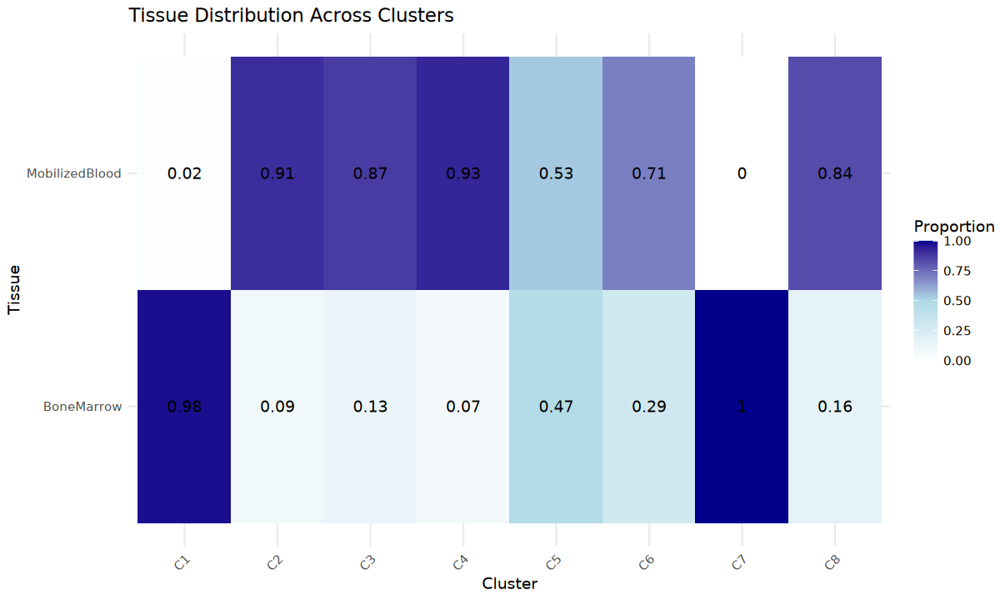

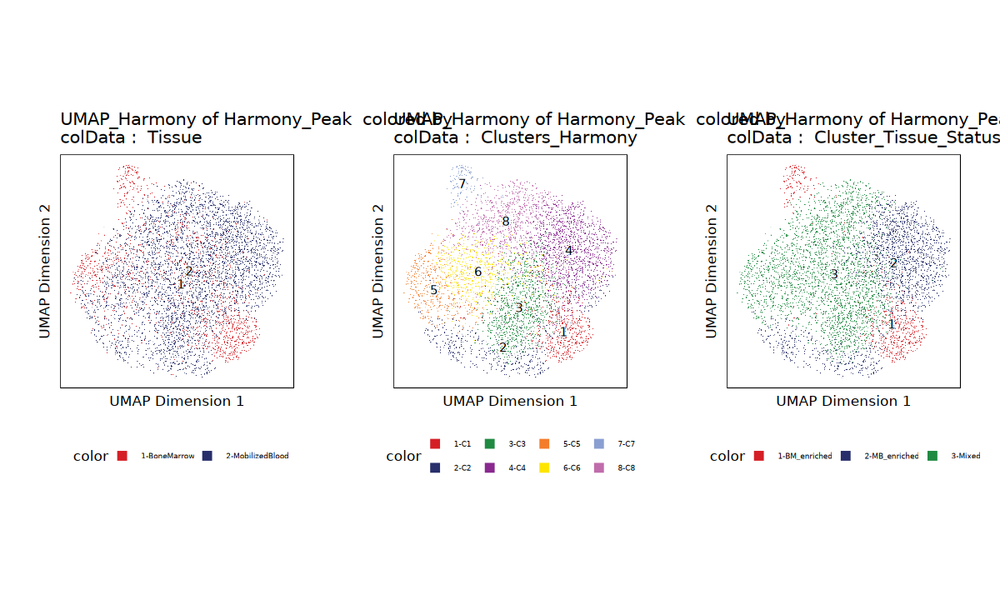

In [67]:
# Tissue proportions for each cluster
cluster_tissue_comp <- table(proj_hsc$Clusters_Harmony, proj_hsc$Tissue)
cluster_tissue_prop <- prop.table(cluster_tissue_comp, margin = 1)

print(cluster_tissue_prop)

# Tissue enrichment categories
tissue_enrichment <- apply(cluster_tissue_prop, 1, function(x) {
  if(x["BoneMarrow"] >= 0.9) return("BM_enriched")
  if(x["MobilizedBlood"] >= 0.9) return("MB_enriched")
  return("Mixed")
})

print(tissue_enrichment)

# Enrichment classifications
proj_hsc$Cluster_Tissue_Status <- tissue_enrichment[proj_hsc$Clusters_Harmony]

# analysis groups
proj_hsc$Analysis_Group <- paste0(proj_hsc$Clusters_Harmony, "_", proj_hsc$Tissue)

# Visualize the enrichment patterns
library(ggplot2)
library(reshape2)

tissue_prop_df <- as.data.frame.matrix(cluster_tissue_prop)
tissue_prop_df$Cluster <- rownames(tissue_prop_df)
tissue_prop_melt <- melt(tissue_prop_df, id.vars = "Cluster")

p_tissue_dist <- ggplot(tissue_prop_melt, aes(x = Cluster, y = variable, fill = value)) +
  geom_tile() +
  scale_fill_gradient2(low = "white", mid = "lightblue", high = "darkblue", 
                       midpoint = 0.5, name = "Proportion") +
  geom_text(aes(label = round(value, 2)), color = "black") +
  theme_minimal() +
  labs(title = "Tissue Distribution Across Clusters", 
       x = "Cluster", y = "Tissue") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

print(p_tissue_dist)

# UMAP
p1 <- plotEmbedding(
  ArchRProj = proj_hsc,
  embedding = "UMAP_Harmony",
  colorBy   = "cellColData",
  name      = "Tissue"
)

# Clusters
p2 <- plotEmbedding(
  ArchRProj = proj_hsc,
  embedding = "UMAP_Harmony",
  colorBy   = "cellColData",
  name      = "Clusters_Harmony"
)

# Enrichment labels
p3 <- plotEmbedding(
  ArchRProj = proj_hsc,
  embedding = "UMAP_Harmony",
  colorBy   = "cellColData",
  name      = "Cluster_Tissue_Status"
)

ggAlignPlots(p1, p2, p3, type = "h")

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-e73669c9376-Date-2025-09-02_Time-10-44-10.131177.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

2025-09-02 10:44:11.642688 : Matching Known Biases, 0.012 mins elapsed.

2025-09-02 10:44:15.447818 : Computing Pairwise Tests (1 of 1), 0.075 mins elapsed.

Pairwise Test MobilizedBlood : Seqnames chr1

Pairwise Test MobilizedBlood : Seqnames chr10

Pairwise Test MobilizedBlood : Seqnames chr11

Pairwise Test MobilizedBlood : Seqnames chr12

Pairwise Test MobilizedBlood : Seqnames chr13

Pairwise Test MobilizedBlood : Seqnames chr14

Pairwise Test MobilizedBlood : Seqnames chr15

Pairwise Test MobilizedBlood : Seqnames chr16

Pairwise Test MobilizedBlood : Seqnames chr17

Pairwise Test MobilizedBlood : Seqnames chr18

Pairwise Test MobilizedBlood : Seqnames chr19

Pairwise Test MobilizedBlood : Seqnames chr2

Pairwise Test MobilizedBlood : Seqnames chr20

Pairwise Test MobilizedBlood 

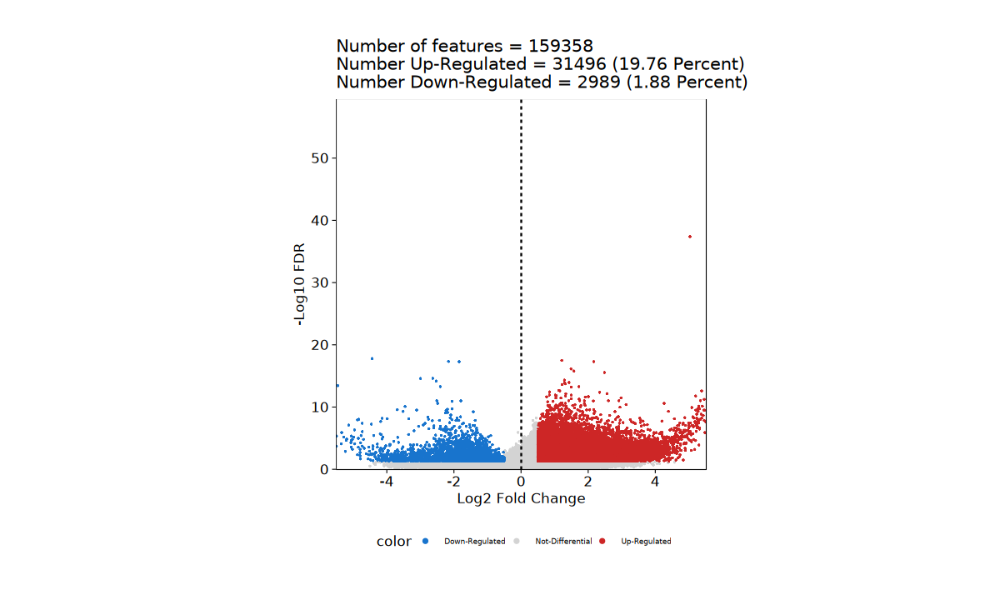

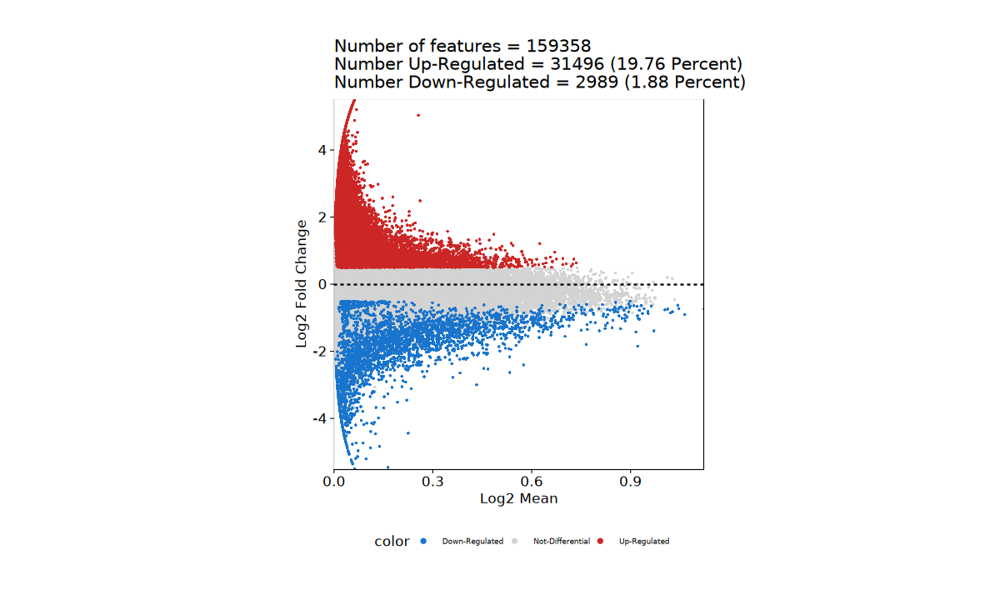

In [48]:
# Adds pseudobulk replicates for differential analysis
# proj_hsc <- addGroupCoverages(
#  ArchRProj = proj_hsc,
#  groupBy = "Tissue",
#  force = TRUE
#)

# Marker peaks
markerPeaks_Tissue <- getMarkerFeatures(
  ArchRProj = proj_hsc,
  useMatrix = "PeakMatrix",
  groupBy = "Tissue",
  testMethod = "wilcoxon",
  bias = c("TSSEnrichment", "log10(nFrags)"),
  useGroups = "MobilizedBlood",
  bgdGroups = "BoneMarrow"
)

# Volcano plot
pv <- plotMarkers(
  seMarker = markerPeaks_Tissue,
  name = "MobilizedBlood",
  cutOff = "FDR <= 0.05 & abs(Log2FC) >= 0.5",
  plotAs = "Volcano"
)
pv

# Significant peaks
markerList_Tissue <- getMarkers(
  markerPeaks_Tissue,
  cutOff = "FDR <= 0.05 & abs(Log2FC) >= 0.5"
)

# Exports differential peaks
write.csv(markerList_Tissue$MobilizedBlood, 
          "MobilizedBlood_vs_BoneMarrow_peaks.csv")

# MA plot for additional visualization
pma <- plotMarkers(
  seMarker = markerPeaks_Tissue,
  name = "MobilizedBlood",
  cutOff = "FDR <= 0.05 & abs(Log2FC) >= 0.5",
  plotAs = "MA"
)
pma

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-e7361feec6eb-Date-2025-09-02_Time-10-47-35.961381.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

2025-09-02 10:47:37.304975 : Matching Known Biases, 0.01 mins elapsed.

###########
2025-09-02 10:49:25.583438 : Completed Pairwise Tests, 1.814 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-e7361feec6eb-Date-2025-09-02_Time-10-47-35.961381.log

ArchR logging to : ArchRLogs/ArchR-plotMarkerHeatmap-e73675f07817-Date-2025-09-02_Time-10-49-26.40489.log
If there is an issue, please report to github with logFile!

Identified 856 markers!

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotMarkerHeatmap-e73675f07817-Date-2025-09-02_Time-10-49-26.40489.log



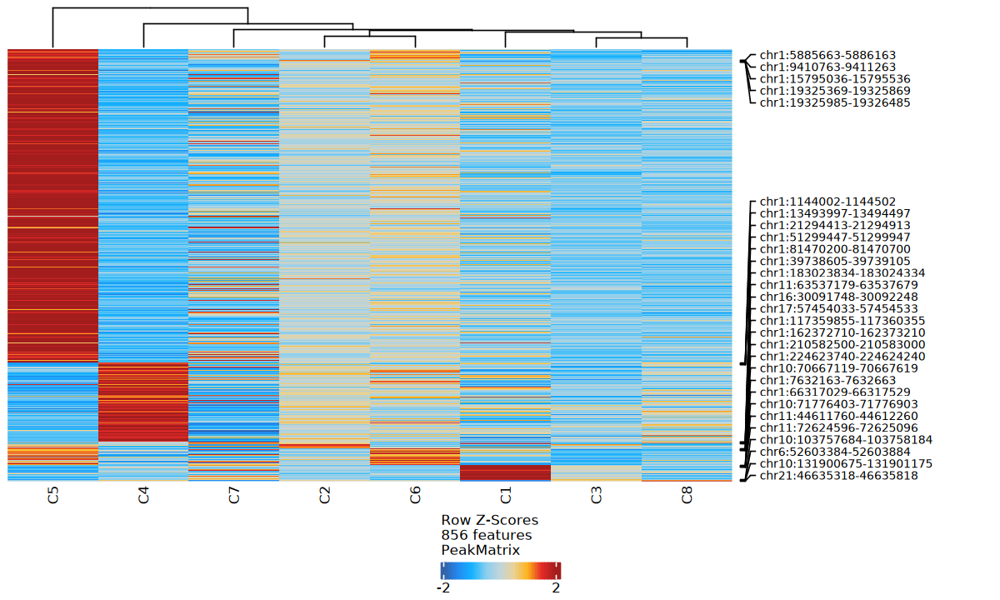

In [49]:
# Gets marker peaks for each cluster
markerPeaks_Clusters <- getMarkerFeatures(
  ArchRProj = proj_hsc,
  useMatrix = "PeakMatrix",
  groupBy = "Clusters_Harmony",
  testMethod = "wilcoxon",
  bias = c("TSSEnrichment", "log10(nFrags)")
)

# Heatmap of top differential peaks across clusters
heatmapPeaks <- plotMarkerHeatmap(
  seMarker = markerPeaks_Clusters,
  cutOff = "FDR <= 0.01 & Log2FC >= 0.5",
  nLabel = 5,
  transpose = FALSE
)
draw(heatmapPeaks, heatmap_legend_side = "bot", 
     annotation_legend_side = "bot")

# Gets marker peaks for each cluster
markerList_Clusters <- getMarkers(
  markerPeaks_Clusters,
  cutOff = "FDR <= 0.05 & Log2FC >= 0.5"
)

# Exports cluster-specific peaks
for(cluster in names(markerList_Clusters)) {
  write.csv(markerList_Clusters[[cluster]], 
            paste0("Cluster_", cluster, "_marker_peaks.csv"))
}

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-e7361722ebbf-Date-2025-09-02_Time-10-54-42.686355.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

2025-09-02 10:54:44.132699 : Matching Known Biases, 0.009 mins elapsed.

2025-09-02 10:54:48.168475 : Computing Pairwise Tests (1 of 1), 0.076 mins elapsed.

Pairwise Test MB_enriched : Seqnames chr1

Pairwise Test MB_enriched : Seqnames chr10

Pairwise Test MB_enriched : Seqnames chr11

Pairwise Test MB_enriched : Seqnames chr12

Pairwise Test MB_enriched : Seqnames chr13

Pairwise Test MB_enriched : Seqnames chr14

Pairwise Test MB_enriched : Seqnames chr15

Pairwise Test MB_enriched : Seqnames chr16

Pairwise Test MB_enriched : Seqnames chr17

Pairwise Test MB_enriched : Seqnames chr18

Pairwise Test MB_enriched : Seqnames chr19

Pairwise Test MB_enriched : Seqnames chr2

Pairwise Test MB_enriched : Seqnames chr20

Pairwise Test MB_enriched : Seqnames chr21

Pairwise Test MB_enrich


    BoneMarrow MobilizedBlood 
           116            811 


ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-e736440fc828-Date-2025-09-02_Time-10-56-31.453299.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

2025-09-02 10:56:33.007038 : Matching Known Biases, 0.01 mins elapsed.

2025-09-02 10:56:36.723136 : Computing Pairwise Tests (1 of 1), 0.072 mins elapsed.

Pairwise Test MobilizedBlood : Seqnames chr1

Pairwise Test MobilizedBlood : Seqnames chr10

Pairwise Test MobilizedBlood : Seqnames chr11

Pairwise Test MobilizedBlood : Seqnames chr12

Pairwise Test MobilizedBlood : Seqnames chr13

Pairwise Test MobilizedBlood : Seqnames chr14

Pairwise Test MobilizedBlood : Seqnames chr15

Pairwise Test MobilizedBlood : Seqnames chr16

Pairwise Test MobilizedBlood : Seqnames chr17

Pairwise Test MobilizedBlood : Seqnames chr18

Pairwise Test MobilizedBlood : Seqnames chr19

Pairwise Test MobilizedBlood : Seqnames chr2

Pairwise Test MobilizedBlood : Seqnames chr20

Pairwise Test MobilizedBlood 

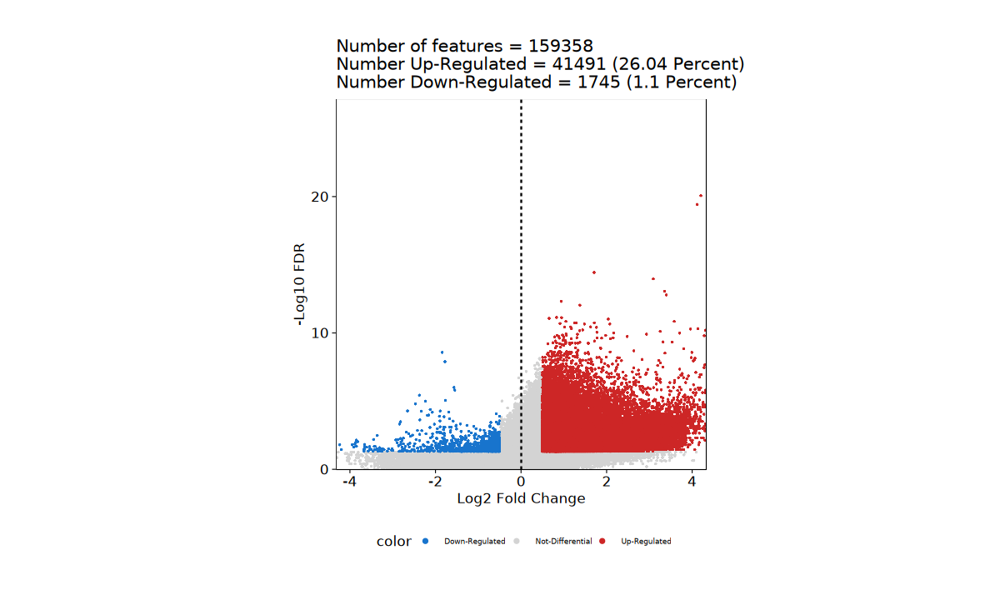

Analyzing mixed cluster: C5




    BoneMarrow MobilizedBlood 
           203            233 


ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-e7365463dbe2-Date-2025-09-02_Time-10-58-33.189619.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

2025-09-02 10:58:34.664083 : Matching Known Biases, 0.011 mins elapsed.

2025-09-02 10:58:37.205981 : Computing Pairwise Tests (1 of 1), 0.053 mins elapsed.

Pairwise Test MobilizedBlood : Seqnames chr1

Pairwise Test MobilizedBlood : Seqnames chr10

Pairwise Test MobilizedBlood : Seqnames chr11

Pairwise Test MobilizedBlood : Seqnames chr12

Pairwise Test MobilizedBlood : Seqnames chr13

Pairwise Test MobilizedBlood : Seqnames chr14

Pairwise Test MobilizedBlood : Seqnames chr15

Pairwise Test MobilizedBlood : Seqnames chr16

Pairwise Test MobilizedBlood : Seqnames chr17

Pairwise Test MobilizedBlood : Seqnames chr18

Pairwise Test MobilizedBlood : Seqnames chr19

Pairwise Test MobilizedBlood : Seqnames chr2

Pairwise Test MobilizedBlood : Seqnames chr20

Pairwise Test MobilizedBlood

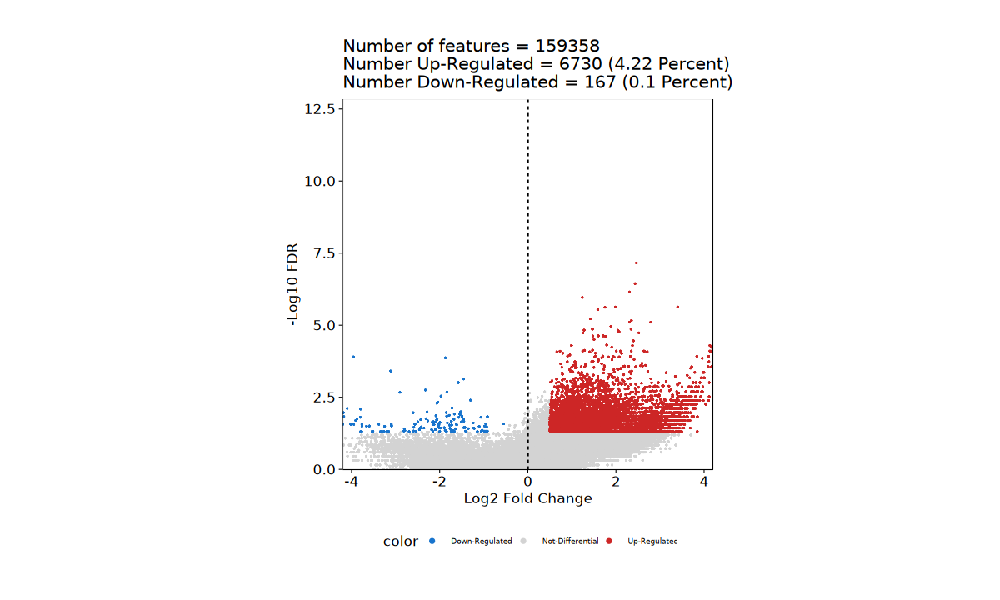

Analyzing mixed cluster: C6




    BoneMarrow MobilizedBlood 
           179            432 


ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-e7366e164b7f-Date-2025-09-02_Time-11-00-31.851832.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

2025-09-02 11:00:33.333707 : Matching Known Biases, 0.009 mins elapsed.

2025-09-02 11:00:36.307801 : Computing Pairwise Tests (1 of 1), 0.058 mins elapsed.

Pairwise Test MobilizedBlood : Seqnames chr1

Pairwise Test MobilizedBlood : Seqnames chr10

Pairwise Test MobilizedBlood : Seqnames chr11

Pairwise Test MobilizedBlood : Seqnames chr12

Pairwise Test MobilizedBlood : Seqnames chr13

Pairwise Test MobilizedBlood : Seqnames chr14

Pairwise Test MobilizedBlood : Seqnames chr15

Pairwise Test MobilizedBlood : Seqnames chr16

Pairwise Test MobilizedBlood : Seqnames chr17

Pairwise Test MobilizedBlood : Seqnames chr18

Pairwise Test MobilizedBlood : Seqnames chr19

Pairwise Test MobilizedBlood : Seqnames chr2

Pairwise Test MobilizedBlood : Seqnames chr20

Pairwise Test MobilizedBlood

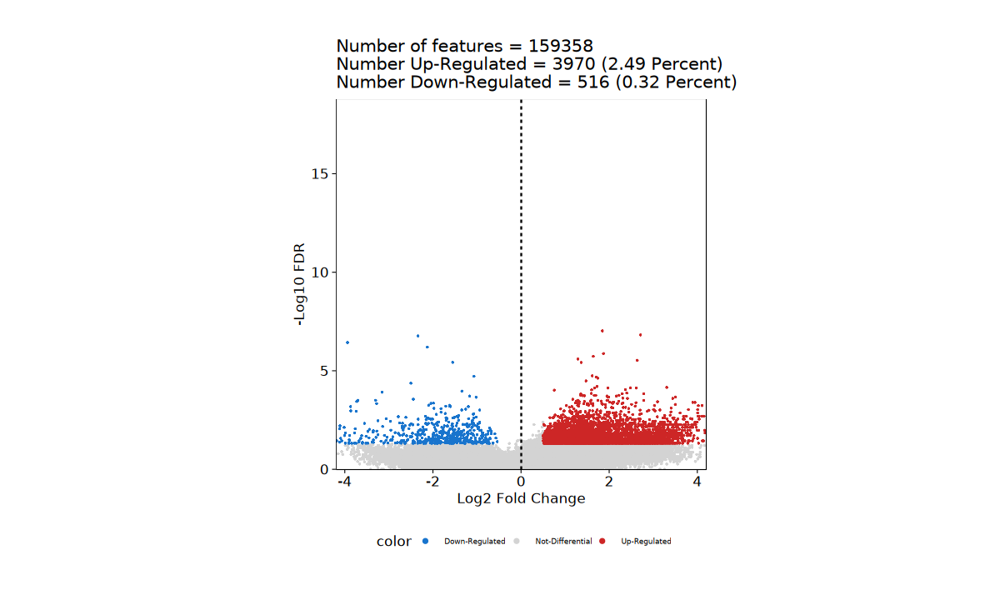

Analyzing mixed cluster: C8




    BoneMarrow MobilizedBlood 
           136            690 


ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-e736159296c4-Date-2025-09-02_Time-11-02-31.895333.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

2025-09-02 11:02:33.272413 : Matching Known Biases, 0.01 mins elapsed.

2025-09-02 11:02:36.549334 : Computing Pairwise Tests (1 of 1), 0.064 mins elapsed.

Pairwise Test MobilizedBlood : Seqnames chr1

Pairwise Test MobilizedBlood : Seqnames chr10

Pairwise Test MobilizedBlood : Seqnames chr11

Pairwise Test MobilizedBlood : Seqnames chr12

Pairwise Test MobilizedBlood : Seqnames chr13

Pairwise Test MobilizedBlood : Seqnames chr14

Pairwise Test MobilizedBlood : Seqnames chr15

Pairwise Test MobilizedBlood : Seqnames chr16

Pairwise Test MobilizedBlood : Seqnames chr17

Pairwise Test MobilizedBlood : Seqnames chr18

Pairwise Test MobilizedBlood : Seqnames chr19

Pairwise Test MobilizedBlood : Seqnames chr2

Pairwise Test MobilizedBlood : Seqnames chr20

Pairwise Test MobilizedBlood 

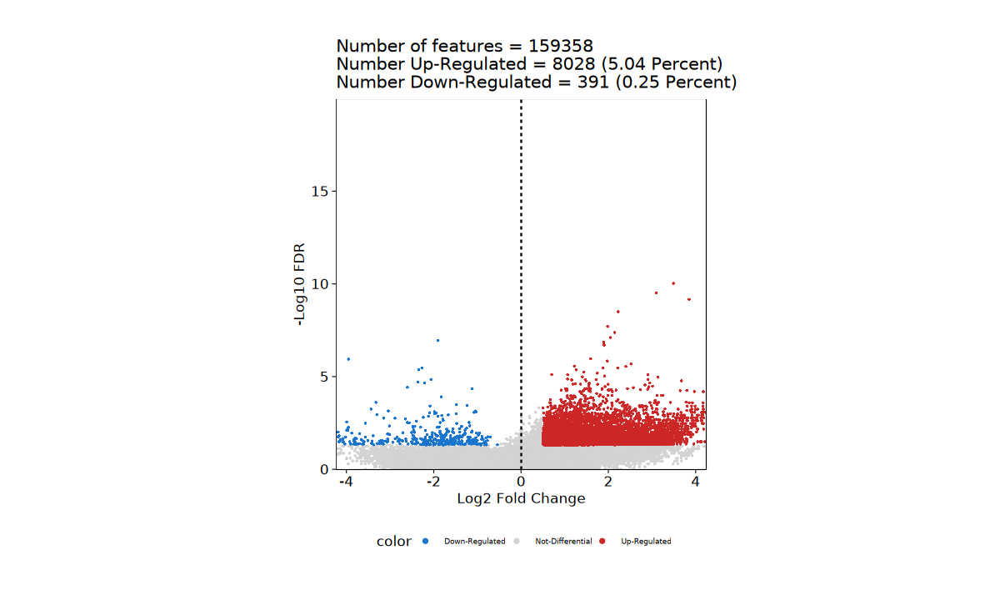

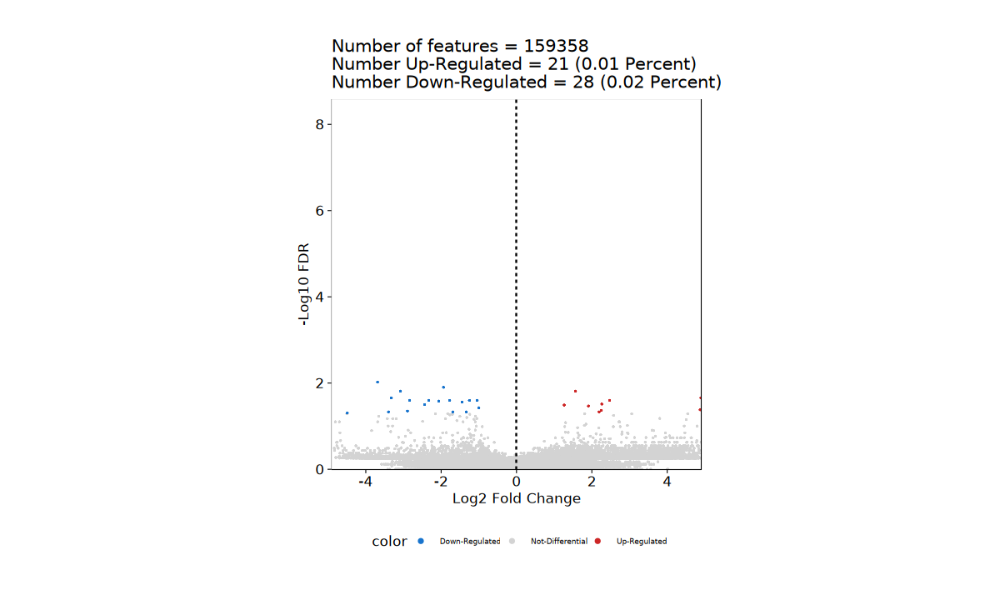

In [50]:
# Compare BM-enriched vs MB-enriched clusters
markerPeaks_Enriched <- getMarkerFeatures(
  ArchRProj = proj_hsc,
  useMatrix = "PeakMatrix",
  groupBy = "Cluster_Tissue_Status",
  testMethod = "wilcoxon",
  bias = c("TSSEnrichment", "log10(nFrags)"),
  useGroups = "MB_enriched",
  bgdGroups = "BM_enriched"
)

# Results
pv_enriched <- plotMarkers(
  seMarker = markerPeaks_Enriched,
  name = "MB_enriched",
  cutOff = "FDR <= 0.05 & abs(Log2FC) >= 0.5",
  plotAs = "Volcano"
)
pv_enriched

# For the mixed clusters (C3, C5, C6 and C8), compares tissues within
mixed_clusters <- c("C3", "C5", "C6", "C8")
differential_peaks_mixed <- list()

for(cluster in mixed_clusters) {
  message("Analyzing mixed cluster: ", cluster)
  
  cells_cluster <- getCellNames(proj_hsc)[proj_hsc$Clusters_Harmony == cluster]
  
  # Checks cell counts
  tissue_counts <- table(proj_hsc$Tissue[proj_hsc$Clusters_Harmony == cluster])
  print(tissue_counts)
  
  if(all(tissue_counts >= 20)) {
    markerPeaks_within <- getMarkerFeatures(
      ArchRProj = proj_hsc[cells_cluster, ],
      useMatrix = "PeakMatrix",
      groupBy = "Tissue",
      testMethod = "wilcoxon",
      bias = c("TSSEnrichment", "log10(nFrags)"),
      useGroups = "MobilizedBlood",
      bgdGroups = "BoneMarrow"
    )
    
    differential_peaks_mixed[[cluster]] <- getMarkers(
      markerPeaks_within,
      cutOff = "FDR <= 0.05 & abs(Log2FC) >= 0.5"
    )
    

    p <- plotMarkers(
      seMarker = markerPeaks_within,
      name = "MobilizedBlood",
      cutOff = "FDR <= 0.05 & abs(Log2FC) >= 0.5",
      plotAs = "Volcano"
    )
    print(p)
  }
}

In [51]:
# Creates categories based on enrichment patterns
# MB-enriched clusters might represent different mobilization sources
proj_hsc$HSC_Hypothesis <- case_when(
  proj_hsc$Clusters_Harmony %in% c("C1", "C7") ~ "BM_Resident",
  proj_hsc$Clusters_Harmony %in% c("C2", "C4") & 
    proj_hsc$Tissue == "MobilizedBlood" ~ "Potential_Non_BM_Source",
  proj_hsc$Clusters_Harmony %in% c("C3", "C5", "C6", "C8") ~ "Mixed_Population",
  TRUE ~ "Other"
)

# Compares potential spleen-derived vs BM-resident HSCs
markerPeaks_Hypothesis <- getMarkerFeatures(
  ArchRProj = proj_hsc,
  useMatrix = "PeakMatrix",
  groupBy = "HSC_Hypothesis",
  useGroups = "Potential_Non_BM_Source",
  bgdGroups = "BM_Resident",
  testMethod = "wilcoxon",
  bias = c("TSSEnrichment", "log10(nFrags)")
)

# Get markers
hypothesis_markers <- getMarkers(
  markerPeaks_Hypothesis,
  cutOff = "FDR <= 0.05 & Log2FC >= 0.5"
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-e73619a68f27-Date-2025-09-02_Time-11-07-13.894264.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

2025-09-02 11:07:15.296236 : Matching Known Biases, 0.011 mins elapsed.

2025-09-02 11:07:19.237461 : Computing Pairwise Tests (1 of 1), 0.076 mins elapsed.

Pairwise Test Potential_Non_BM_Source : Seqnames chr1

Pairwise Test Potential_Non_BM_Source : Seqnames chr10

Pairwise Test Potential_Non_BM_Source : Seqnames chr11

Pairwise Test Potential_Non_BM_Source : Seqnames chr12

Pairwise Test Potential_Non_BM_Source : Seqnames chr13

Pairwise Test Potential_Non_BM_Source : Seqnames chr14

Pairwise Test Potential_Non_BM_Source : Seqnames chr15

Pairwise Test Potential_Non_BM_Source : Seqnames chr16

Pairwise Test Potential_Non_BM_Source : Seqnames chr17

Pairwise Test Potential_Non_BM_Source : Seqnames chr18

Pairwise Test Potential_Non_BM_Source : Seqnames chr19

Pairwise Test Potentia

In [54]:
# Differential gene activity between tissues
markerGenes_Tissue <- getMarkerFeatures(
  ArchRProj = proj_hsc,
  useMatrix = "GeneScoreMatrix",
  groupBy = "Tissue",
  testMethod = "wilcoxon",
  bias = c("TSSEnrichment", "log10(nFrags)"),
  useGroups = "MobilizedBlood",
  bgdGroups = "BoneMarrow"
)

# Key HSC and mobilization genes
hsc_genes <- c("KIT", "THY1", "ENG", "PROM1", "CD34", "FLT3")
mobilization_genes <- c("CXCR4", "VWF", "CXCL12", "VCAM1", "ITGA4", "ITGB1")
spleen_genes <- c("CD8A", "LTB", "CCR7", "TCF7", "LEF1", "CD163")

# Plot gene activity
p_hsc <- plotEmbedding(
  proj_hsc, colorBy = "GeneScoreMatrix",
  name = hsc_genes, embedding = "UMAP_Harmony",
  quantCut = c(0.01, 0.95), imputeWeights = NULL
)

p_mob <- plotEmbedding(
  proj_hsc, colorBy = "GeneScoreMatrix",
  name = mobilization_genes, embedding = "UMAP_Harmony",
  quantCut = c(0.01, 0.95), imputeWeights = NULL
)

p_spleen <- plotEmbedding(
  proj_hsc, colorBy = "GeneScoreMatrix",
  name = spleen_genes[1:6], embedding = "UMAP_Harmony",
  quantCut = c(0.01, 0.95), imputeWeights = NULL
)

# Differential gene activity for enriched clusters
markerGenes_Enriched <- getMarkerFeatures(
  ArchRProj = proj_hsc,
  useMatrix = "GeneScoreMatrix",
  groupBy = "Cluster_Tissue_Status",
  testMethod = "wilcoxon",
  bias = c("TSSEnrichment", "log10(nFrags)"),
  useGroups = "MB_enriched",
  bgdGroups = "BM_enriched"
)

# Get top differential genes
topGenes_MB <- head(rownames(markerGenes_Enriched)[order(
  assay(markerGenes_Enriched)[,1], decreasing = TRUE)], 50)
topGenes_BM <- head(rownames(markerGenes_Enriched)[order(
  assay(markerGenes_Enriched)[,1], decreasing = FALSE)], 50)

print("Top MB-enriched genes:")
print(topGenes_MB[1:20])
print("Top BM-enriched genes:")
print(topGenes_BM[1:20])

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-e73634e16953-Date-2025-09-02_Time-11-10-57.428304.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Double.Matrix

2025-09-02 11:10:58.736837 : Matching Known Biases, 0.008 mins elapsed.

2025-09-02 11:11:02.398957 : Computing Pairwise Tests (1 of 1), 0.069 mins elapsed.

Pairwise Test MobilizedBlood : Seqnames chr1

Pairwise Test MobilizedBlood : Seqnames chr10

Pairwise Test MobilizedBlood : Seqnames chr11

Pairwise Test MobilizedBlood : Seqnames chr12

Pairwise Test MobilizedBlood : Seqnames chr13

Pairwise Test MobilizedBlood : Seqnames chr14

Pairwise Test MobilizedBlood : Seqnames chr15

Pairwise Test MobilizedBlood : Seqnames chr16

Pairwise Test MobilizedBlood : Seqnames chr17

Pairwise Test MobilizedBlood : Seqnames chr18

Pairwise Test MobilizedBlood : Seqnames chr19

Pairwise Test MobilizedBlood : Seqnames chr2

Pairwise Test MobilizedBlood : Seqnames chr20

Pairwise Test MobilizedBlood 

23504" "1867"  "3982"  "16659" "18250" "15093" "556"  
[19] "1296"  "17909"


ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-e736da0355-Date-2025-09-02_Time-11-26-18.682799.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Double.Matrix

2025-09-02 11:26:20.219512 : Matching Known Biases, 0.011 mins elapsed.

2025-09-02 11:26:23.959377 : Computing Pairwise Tests (1 of 1), 0.073 mins elapsed.

Pairwise Test MobilizedBlood : Seqnames chr1

Pairwise Test MobilizedBlood : Seqnames chr10

Pairwise Test MobilizedBlood : Seqnames chr11

Pairwise Test MobilizedBlood : Seqnames chr12

Pairwise Test MobilizedBlood : Seqnames chr13

Pairwise Test MobilizedBlood : Seqnames chr14

Pairwise Test MobilizedBlood : Seqnames chr15

Pairwise Test MobilizedBlood : Seqnames chr16

Pairwise Test MobilizedBlood : Seqnames chr17

Pairwise Test MobilizedBlood : Seqnames chr18

Pairwise Test MobilizedBlood : Seqnames chr19

Pairwise Test MobilizedBlood : Seqnames chr2

Pairwise Test MobilizedBlood : Seqnames chr20

Pairwise Test MobilizedBlood : 

R_zmq_msg_send errno: 4 strerror: Unterbrechung während des Betriebssystemaufrufs




Plotting Embedding

1 
2 
3 
4 
5 
6 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e73673505d8b-Date-2025-09-02_Time-11-28-21.534551.log



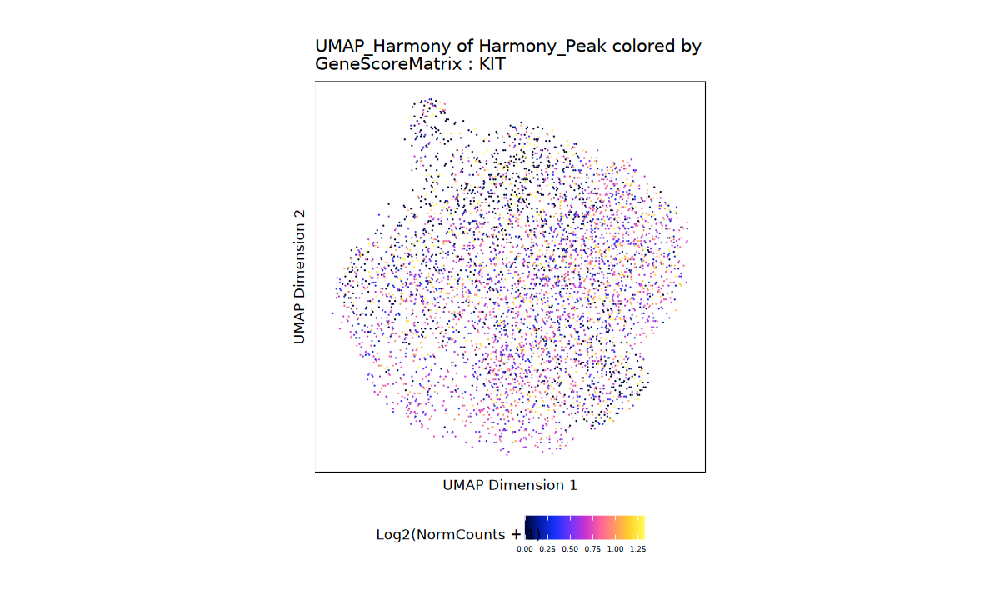

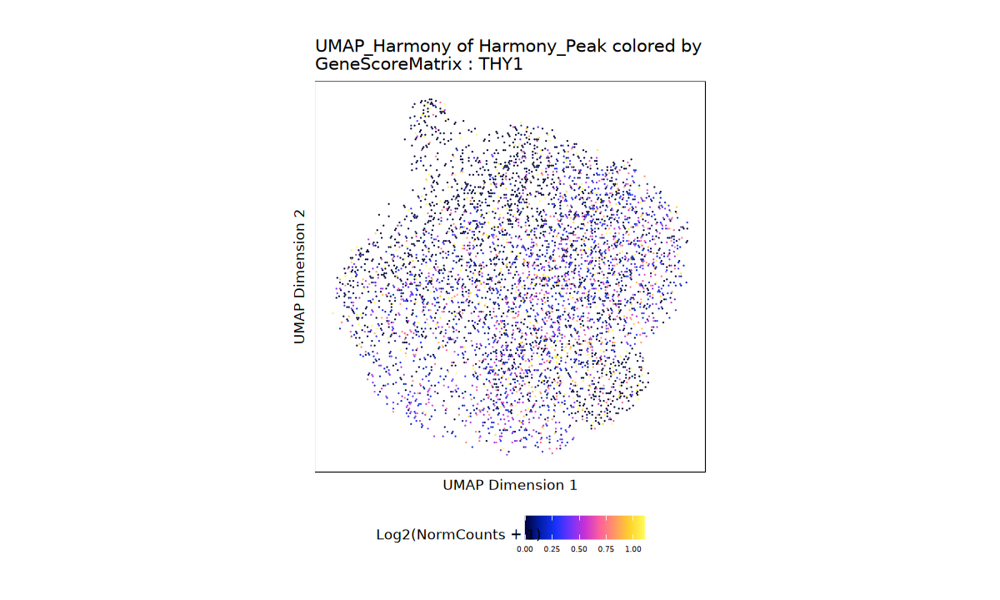

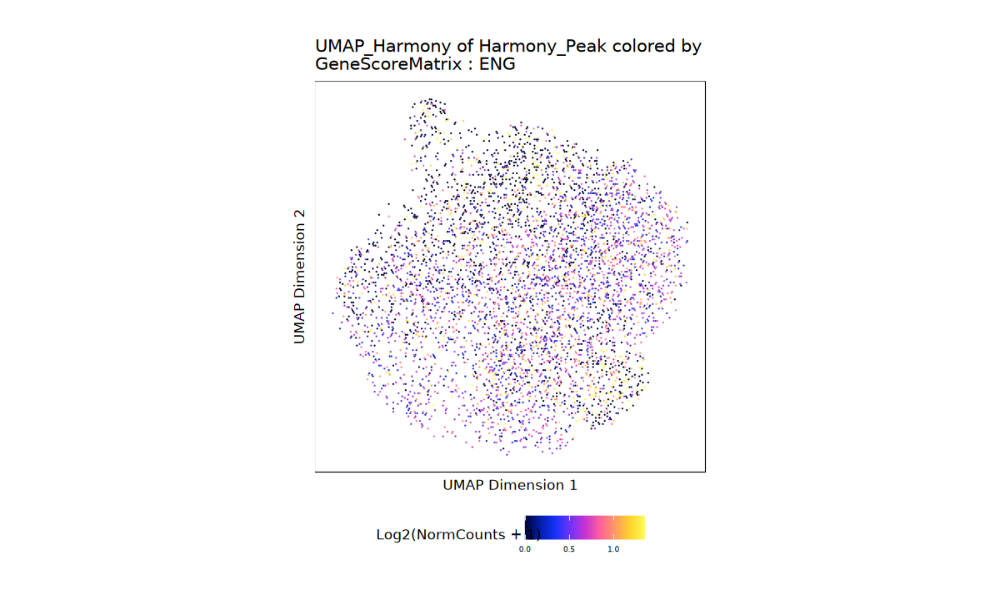

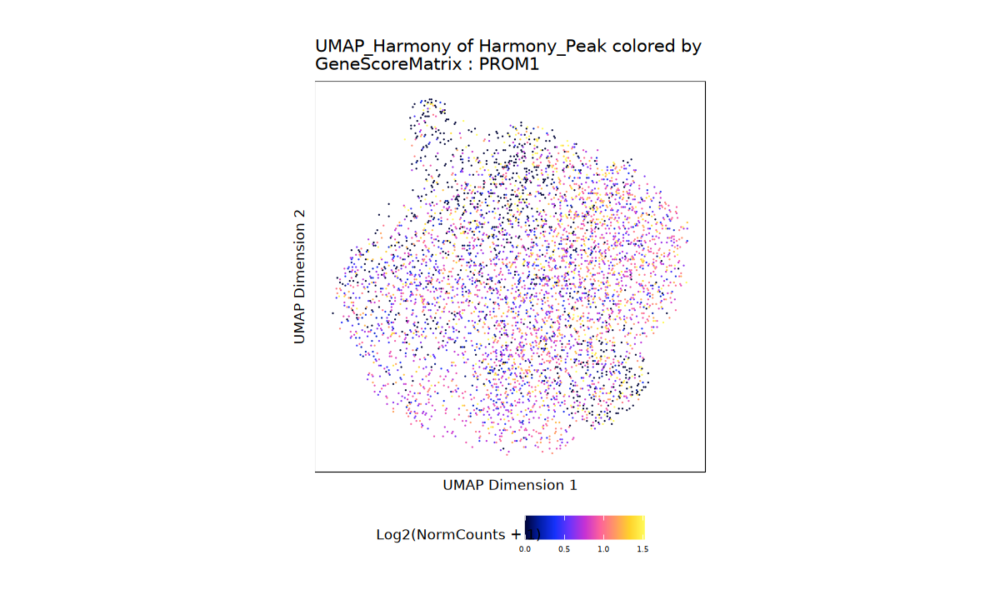

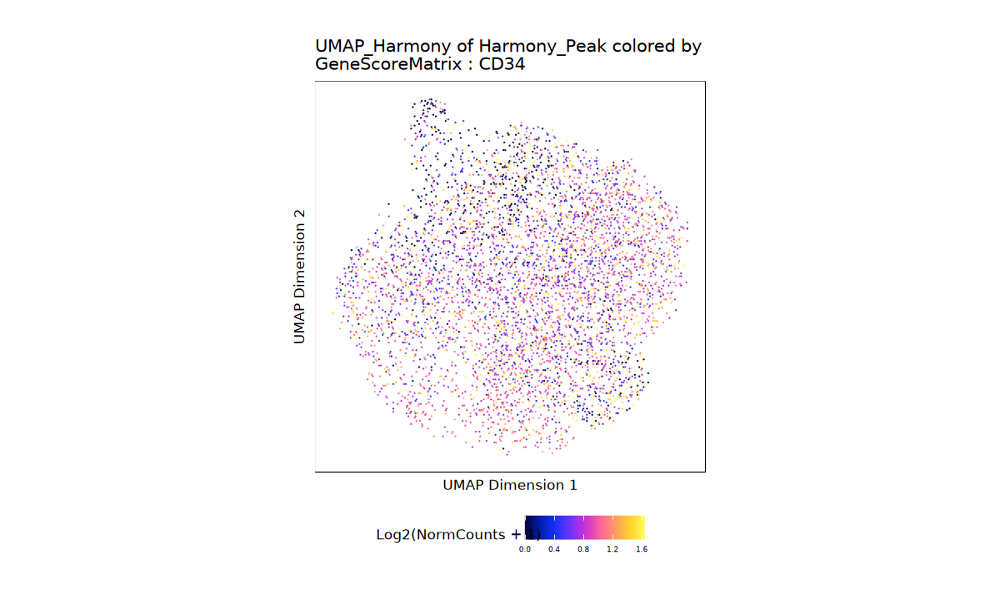

...

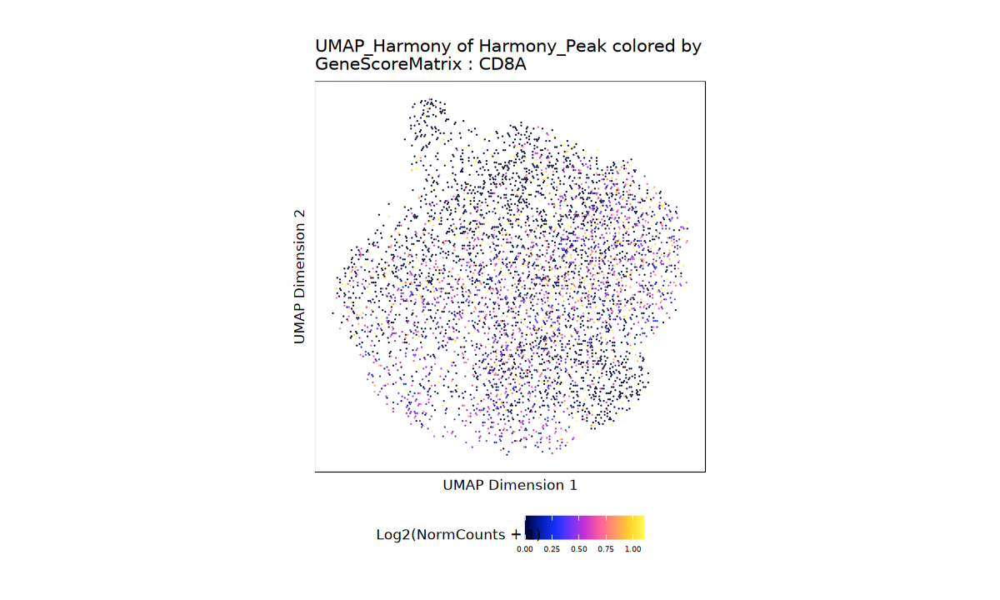

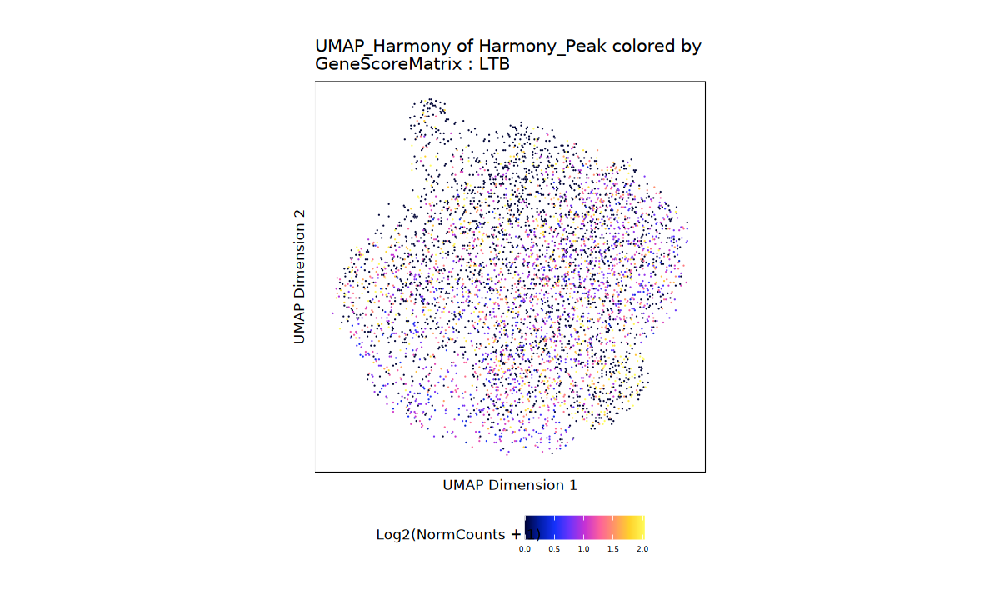

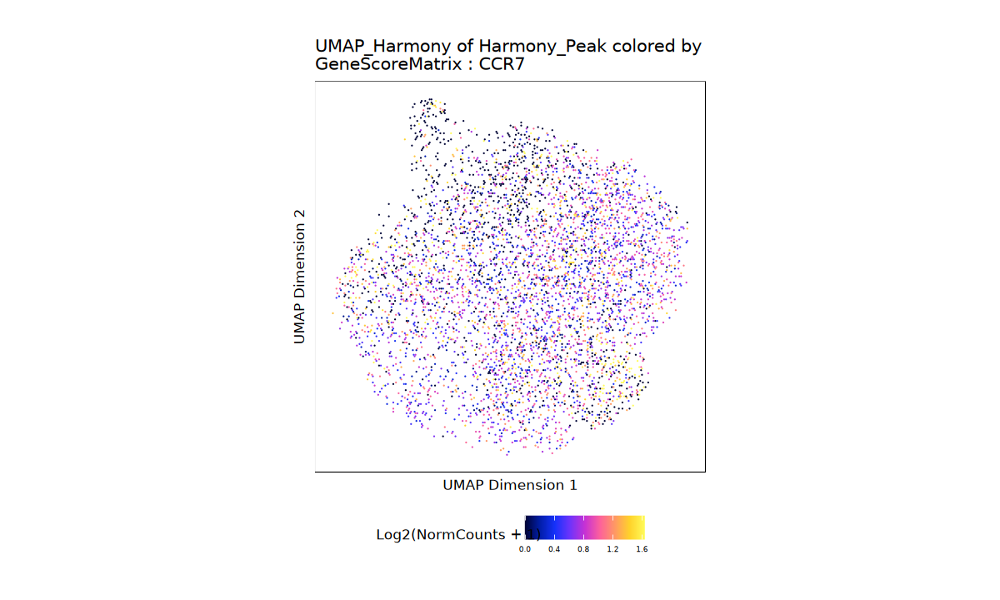

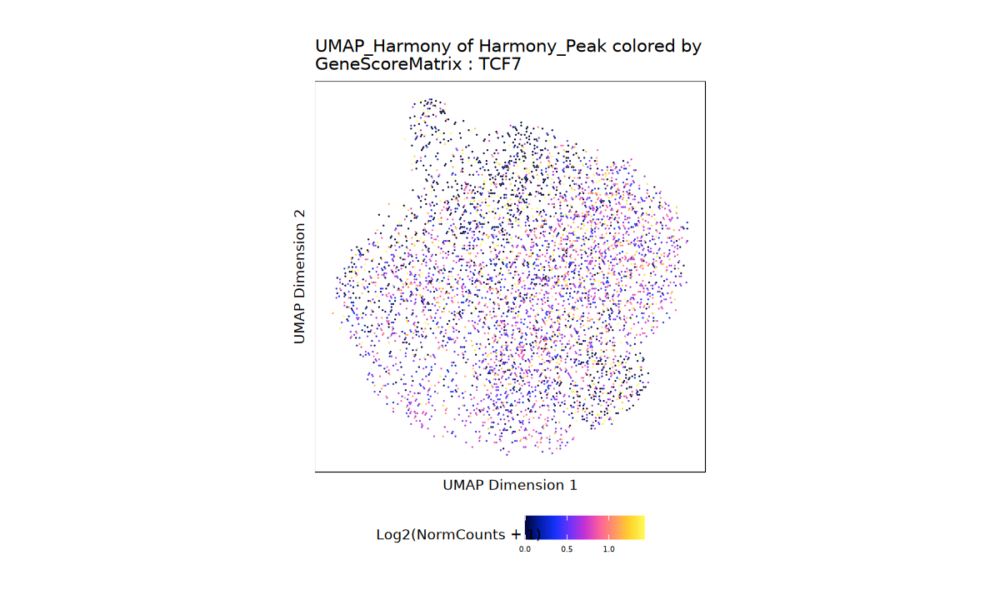

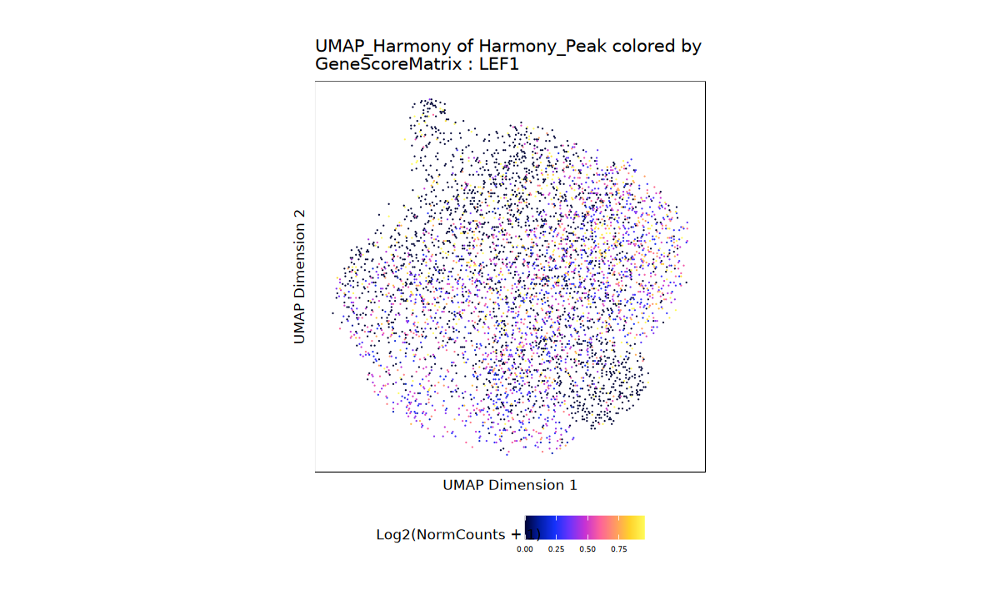

pdf 
  2

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e73665da28ac-Date-2025-09-02_Time-11-29-02.122591.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-09-02 11:29:03.374615 : 



Plotting Embedding

1 
2 
3 
4 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e73665da28ac-Date-2025-09-02_Time-11-29-02.122591.log



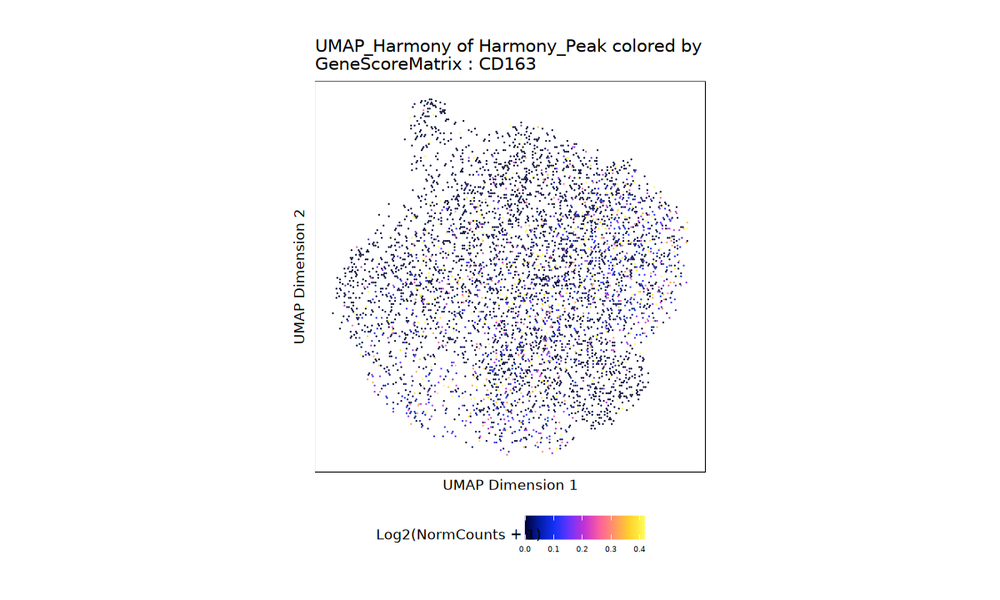

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-e7364a1a1ece-Date-2025-09-02_Time-11-29-14.073391.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Double.Matrix

2025-09-02 11:29:15.173641 : Matching Known Biases, 0.007 mins elapsed.

2025-09-02 11:29:19.503513 : Computing Pairwise Tests (1 of 1), 0.079 mins elapsed.

Pairwise Test MB_enriched : Seqnames chr1

Pairwise Test MB_enriched : Seqnames chr10

Pairwise Test MB_enriched : Seqnames chr11

Pairwise Test MB_enriched : Seqnames chr12

Pairwise Test MB_enriched : Seqnames chr13

Pairwise Test MB_enriched : Seqnames chr14

Pairwise Test MB_enriched : Seqnames chr15

Pairwise Test MB_enriched : Seqnames chr16

Pairwise Test MB_enriched : Seqnames chr17

Pairwise Test MB_enriched : Seqnames chr18

Pairwise Test MB_enriched : Seqnames chr19

Pairwise Test MB_enriched : Seqnames chr2

Pairwise Test MB_enriched : Seqnames chr20

Pairwise Test MB_enriched : Seqnames chr21

Pairwise Test MB_enriche

zmq_msg_send errno: 4 strerror: Unterbrechung während des Betriebssystemaufrufs
2"   "23986" "6253"  "6254"  "5173"  "1354" 
[10] "225"   "698"   "383"   "3583"  "949"   "1321"  "19656" "9550"  "22938"
[19] "2770"  "5186" 
[1] "Top BM-enriched genes:"
 [1] "9059"  "11984" "4013"  "12744" "4003"  "9058"  "16797" "7778"  "4744" 
[10] "212"   "9060"  "23504" "1867"  "3982"  "16659" "18250" "15093" "556"  
[19] "1296"  "17909"
[1] "Detailed MB-enriched genes:"
    Gene Log2FC
1  22936  6.311
2  22934  5.681
3   6255  5.647
4    382  5.640
5  23986  5.286
6   6253  5.264
7   6254  4.943
8   5173  4.933
9   1354  4.665
10   225  4.593
11   698  4.510
12   383  4.477
13  3583  4.410
14   949  4.398
15  1321  4.381
16 19656  4.177
17  9550  4.156
18 22938  4.074
19  2770  4.062
20  5186  4.006
[1] "Detailed BM-enriched genes:"
    Gene Log2FC
1   9059 -4.706
2  11984 -4.565
3   4013 -4.480
4  12744 -4.230
5   4003 -4.170
6   9058 -3.972
7  16797 -3.965
8   7778 -3.868
9   4744 -3.853
10   212 

Getting ImputeWeights

No imputeWeights found, returning NULL

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e7364cb0c9c7-Date-2025-09-02_Time-11-30-45.916326.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-09-02 11:30:47.202945 : 

FeatureName (22936,22934,6255,382,23986,6253) does not exist! See getFeatures



ERROR: Error: 



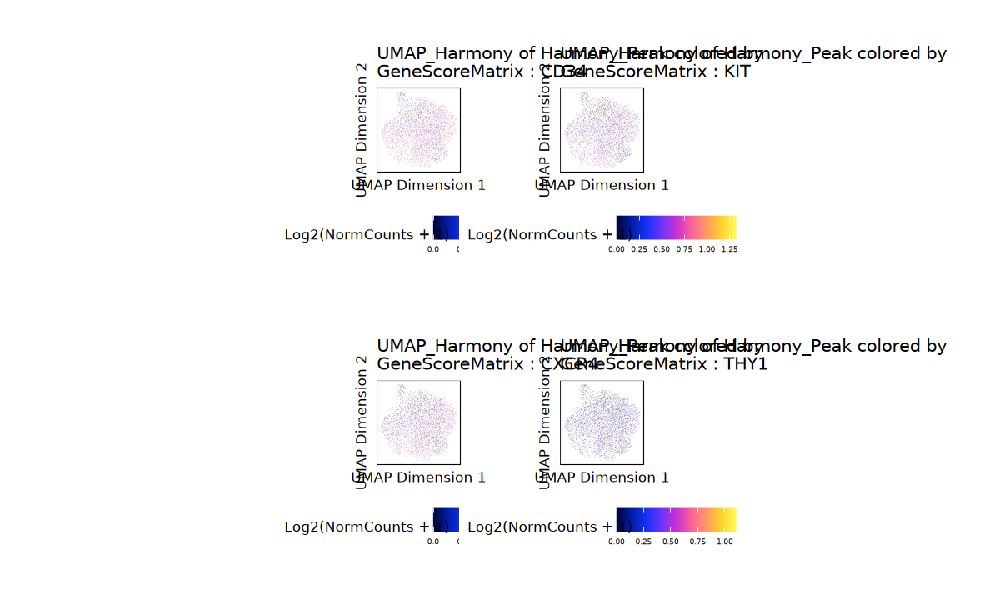

In [59]:
# Differential gene activity between tissues
markerGenes_Tissue <- getMarkerFeatures(
  ArchRProj = proj_hsc,
  useMatrix = "GeneScoreMatrix",
  groupBy = "Tissue",
  testMethod = "wilcoxon",
  bias = c("TSSEnrichment", "log10(nFrags)"),
  useGroups = "MobilizedBlood",
  bgdGroups = "BoneMarrow"
)

# Key HSC and mobilization genes
hsc_genes <- c("KIT", "THY1", "ENG", "PROM1", "CD34", "FLT3")
mobilization_genes <- c("CXCR4", "VWF", "CXCL12", "VCAM1", "ITGA4", "ITGB1")
spleen_genes <- c("CD8A", "LTB", "CCR7", "TCF7", "LEF1", "CD163")

# Plot gene activity
p_hsc <- plotEmbedding(
  ArchRProj = proj_hsc, 
  colorBy = "GeneScoreMatrix",
  name = hsc_genes, 
  embedding = "UMAP_Harmony",
  quantCut = c(0.01, 0.95), 
  imputeWeights = NULL
)

p_mob <- plotEmbedding(
  ArchRProj = proj_hsc, 
  colorBy = "GeneScoreMatrix",
  name = mobilization_genes, 
  embedding = "UMAP_Harmony",
  quantCut = c(0.01, 0.95), 
  imputeWeights = NULL
)

p_spleen <- plotEmbedding(
  ArchRProj = proj_hsc, 
  colorBy = "GeneScoreMatrix",
  name = spleen_genes, 
  embedding = "UMAP_Harmony",
  quantCut = c(0.01, 0.95), 
  imputeWeights = NULL
)

# Display plots in console/RStudio
print("HSC Marker Genes:")
for(i in seq_along(p_hsc)) {
  print(p_hsc[[i]])
}

print("Mobilization Genes:")
for(i in seq_along(p_mob)) {
  print(p_mob[[i]])
}

print("Spleen-associated Genes:")
for(i in seq_along(p_spleen)) {
  print(p_spleen[[i]])
}

# Save all plots to PDF
pdf("Gene_Activity_Analysis.pdf", width = 16, height = 10)

# HSC genes in grid
if(length(p_hsc) > 0) {
  print(cowplot::plot_grid(plotlist = p_hsc[1:min(6, length(p_hsc))], 
                          ncol = 3, labels = hsc_genes[1:min(6, length(p_hsc))]))
}

# Mobilization genes in grid
if(length(p_mob) > 0) {
  print(cowplot::plot_grid(plotlist = p_mob[1:min(6, length(p_mob))], 
                          ncol = 3, labels = mobilization_genes[1:min(6, length(p_mob))]))
}

# Spleen genes in grid
if(length(p_spleen) > 0) {
  print(cowplot::plot_grid(plotlist = p_spleen[1:min(6, length(p_spleen))], 
                          ncol = 3, labels = spleen_genes[1:min(6, length(p_spleen))]))
}

dev.off()

# Create combined plots for key genes
library(patchwork)

# Select most important genes for combined visualization
key_genes_combined <- c("CD34", "KIT", "CXCR4", "THY1")

p_key <- plotEmbedding(
  ArchRProj = proj_hsc,
  colorBy = "GeneScoreMatrix",
  name = key_genes_combined,
  embedding = "UMAP_Harmony",
  quantCut = c(0.01, 0.95),
  imputeWeights = NULL
)

# Create a combined panel
combined_plot <- p_key[[1]] + p_key[[2]] + p_key[[3]] + p_key[[4]] + 
  plot_layout(ncol = 2)
print(combined_plot)

# Differential gene activity for enriched clusters
markerGenes_Enriched <- getMarkerFeatures(
  ArchRProj = proj_hsc,
  useMatrix = "GeneScoreMatrix",
  groupBy = "Cluster_Tissue_Status",
  testMethod = "wilcoxon",
  bias = c("TSSEnrichment", "log10(nFrags)"),
  useGroups = "MB_enriched",
  bgdGroups = "BM_enriched"
)

# Get top differential genes with proper extraction
# First, let's examine the structure
marker_se <- markerGenes_Enriched
print(class(marker_se))
print(dim(marker_se))

# Get the assay data
marker_data <- assays(marker_se)[[1]]  # or assay(marker_se)
print(colnames(marker_data))

# Extract Log2FC values (adjust column name based on actual output)
if("Log2FC" %in% colnames(marker_data)) {
  log2fc_values <- marker_data[, "Log2FC"]
} else if("MB_enriched" %in% colnames(marker_data)) {
  # Sometimes it's named after the group
  log2fc_values <- marker_data[, "MB_enriched"]
} else {
  # Use first column if unsure
  log2fc_values <- marker_data[, 1]
}

# Get top genes
top_mb_indices <- head(order(log2fc_values, decreasing = TRUE), 50)
top_bm_indices <- head(order(log2fc_values, decreasing = FALSE), 50)

topGenes_MB <- rownames(marker_se)[top_mb_indices]
topGenes_BM <- rownames(marker_se)[top_bm_indices]

print("Top MB-enriched genes:")
print(topGenes_MB[1:20])

print("Top BM-enriched genes:")
print(topGenes_BM[1:20])

# Create detailed results table
top_mb_detailed <- data.frame(
  Gene = topGenes_MB[1:20],
  Log2FC = round(log2fc_values[top_mb_indices[1:20]], 3),
  row.names = NULL
)

top_bm_detailed <- data.frame(
  Gene = topGenes_BM[1:20],
  Log2FC = round(log2fc_values[top_bm_indices[1:20]], 3),
  row.names = NULL
)

print("Detailed MB-enriched genes:")
print(top_mb_detailed)

print("Detailed BM-enriched genes:")
print(top_bm_detailed)

# Visualize top differential genes
p_top_mb <- plotEmbedding(
  ArchRProj = proj_hsc,
  colorBy = "GeneScoreMatrix",
  name = topGenes_MB[1:6],
  embedding = "UMAP_Harmony",
  quantCut = c(0.01, 0.95)
)

p_top_bm <- plotEmbedding(
  ArchRProj = proj_hsc,
  colorBy = "GeneScoreMatrix",
  name = topGenes_BM[1:6],
  embedding = "UMAP_Harmony",
  quantCut = c(0.01, 0.95)
)

# Display top differential genes
print("Top MB-enriched gene activity patterns:")
for(i in 1:6) {
  print(p_top_mb[[i]])
}

print("Top BM-enriched gene activity patterns:")
for(i in 1:6) {
  print(p_top_bm[[i]])
}

# marker genes
plotMarkerHeatmap(
  seMarker = markerGenes_Enriched,
  cutOff = "FDR <= 0.01 & abs(Log2FC) >= 0.25",
  labelMarkers = topGenes_MB[1:10],
  transpose = FALSE
)

In [60]:
# Specifically test if MB-enriched clusters show different organ signatures
# suggesting mobilization from different sites

mb_enriched_clusters <- c("C2", "C3", "C4", "C8")

# Compare organ signatures between MB-enriched clusters
mb_enriched_data <- score_data[score_data$Cluster %in% mb_enriched_clusters & 
                               score_data$Tissue == "MobilizedBlood", ]

# Perform clustering on organ signatures to identify potential sources
if(nrow(mb_enriched_data) > 0) {
  
  # Create signature matrix
  sig_matrix <- as.matrix(mb_enriched_data[, score_columns])
  rownames(sig_matrix) <- paste(mb_enriched_data$Cluster, 1:nrow(mb_enriched_data), sep = "_")
  
  # Calculate mean signatures per cluster
  cluster_signatures <- aggregate(
    mb_enriched_data[, score_columns],
    by = list(Cluster = mb_enriched_data$Cluster),
    FUN = mean
  )
  
  # Create a radar plot for each MB-enriched cluster
  library(fmsb)
  
  pdf("MB_Cluster_Organ_Signatures.pdf", width = 12, height = 10)
  
  # Prepare data for radar plot
  radar_data <- cluster_signatures[, -1]
  rownames(radar_data) <- cluster_signatures$Cluster
  
  # Normalize to 0-1 scale
  radar_data <- as.data.frame(apply(radar_data, 2, function(x) {
    (x - min(x)) / (max(x) - min(x))
  }))
  
  # Add max and min rows for radar plot
  radar_data <- rbind(rep(1, ncol(radar_data)), 
                     rep(0, ncol(radar_data)), 
                     radar_data)
  
  # Plot radar for each cluster
  colors <- c("#E41A1C", "#377EB8", "#4DAF4A", "#984EA3")
  
  for(i in 3:nrow(radar_data)) {
    radarchart(radar_data[c(1, 2, i), ],
              axistype = 1,
              pcol = colors[i-2],
              pfcol = scales::alpha(colors[i-2], 0.3),
              plwd = 2,
              title = paste("Cluster", rownames(radar_data)[i], "Organ Signatures"))
  }
  
  dev.off()
  
  # Identify potential organ sources
  cat("\nPotential organ sources for MB-enriched clusters:\n")
  for(i in 1:nrow(cluster_signatures)) {
    cluster <- cluster_signatures$Cluster[i]
    scores <- cluster_signatures[i, -1]
    max_score <- names(scores)[which.max(scores)]
    
    # Remove "Score_" prefix for cleaner output
    organ <- gsub("Score_", "", max_score)
    
    cat("  Cluster", cluster, ":", organ, 
        "(score =", round(max(scores), 3), ")\n")
    
    # Check if it's likely from spleen or liver
    if(grepl("Spleen|Liver", organ)) {
      cat("    -> Potential non-BM mobilization source detected!\n")
    }
  }
}

ERROR: Error: Objekt 'score_data' nicht gefunden


In [63]:
# Create summary plots
library(ComplexHeatmap)

# Correct format
p1 <- plotEmbedding(proj_hsc, colorBy = "cellColData", name = "Tissue", embedding = "UMAP_Harmony")
p2 <- plotEmbedding(proj_hsc, colorBy = "cellColData", name = "Clusters_Harmony", embedding = "UMAP_Harmony", labelMeans = TRUE)
p3 <- plotEmbedding(proj_hsc, colorBy = "cellColData", name = "Cluster_Tissue_Status", embedding = "UMAP_Harmony")
p4 <- plotEmbedding(proj_hsc, colorBy = "GeneScoreMatrix", name = "CXCR4", embedding = "UMAP_Harmony")

pdf("HSC_Comparison_Summary.pdf", width = 16, height = 12)
ggAlignPlots(p1, p2, p3, p4, type = "h")
dev.off()

# Export key results
# 1. Tissue-specific peaks
write.csv(markerList_Tissue$MobilizedBlood, 
          "Results/MobilizedBlood_specific_peaks.csv")

# 2. Enriched cluster peaks
mb_enriched_peaks <- getMarkers(markerPeaks_Enriched, 
                                cutOff = "FDR <= 0.05 & Log2FC >= 0.5")
write.csv(mb_enriched_peaks$MB_enriched, 
          "Results/MB_enriched_cluster_peaks.csv")

# 3. Mixed cluster differential peaks
for(cluster in names(differential_peaks_mixed)) {
  if(!is.null(differential_peaks_mixed[[cluster]]$MobilizedBlood)) {
    write.csv(differential_peaks_mixed[[cluster]]$MobilizedBlood,
              paste0("Results/Mixed_", cluster, "_MB_specific_peaks.csv"))
  }
}

# Create final summary table
summary_table <- data.frame(
  Cluster = rownames(cluster_tissue_comp),
  BM_cells = cluster_tissue_comp[,"BoneMarrow"],
  MB_cells = cluster_tissue_comp[,"MobilizedBlood"],
  BM_proportion = round(cluster_tissue_prop[,"BoneMarrow"], 3),
  MB_proportion = round(cluster_tissue_prop[,"MobilizedBlood"], 3),
  Classification = tissue_enrichment
)

write.csv(summary_table, "Results/Cluster_Tissue_Summary.csv", row.names = FALSE)

# Save the annotated project
saveArchRProject(ArchRProj = proj_hsc, 
                 outputDirectory = "HSC_Analysis_Enriched")

print("Analysis complete! Key findings:")
print(paste("- BM-enriched clusters:", paste(names(tissue_enrichment)[tissue_enrichment == "BM_enriched"], collapse = ", ")))
print(paste("- MB-enriched clusters:", paste(names(tissue_enrichment)[tissue_enrichment == "MB_enriched"], collapse = ", ")))
print(paste("- Mixed clusters:", paste(names(tissue_enrichment)[tissue_enrichment == "Mixed"], collapse = ", ")))
print(paste("- Number of tissue-specific peaks:", nrow(markerList_Tissue$MobilizedBlood)))

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e7367a6ff686-Date-2025-09-02_Time-11-38-26.011052.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e7367a6ff686-Date-2025-09-02_Time-11-38-26.011052.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e7363535bbfa-Date-2025-09-02_Time-11-38-27.707912.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e7363535bbfa-Date-2025-09-02_Time-11-38-27.707912.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e73675ef1fca-Date-2025-09-02_Time-11-38-29.422613.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e7

pdf 
  2

Warning message in file(file, ifelse(append, "a", "w")):
“kann Datei 'Results/MobilizedBlood_specific_peaks.csv' nicht öffnen: Datei oder Verzeichnis nicht gefunden”


ERROR: Error in file(file, ifelse(append, "a", "w")): kann Verbindung nicht öffnen


ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-e7361dd318a3-Date-2025-09-02_Time-11-32-52.007147.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Double.Matrix

2025-09-02 11:32:53.219972 : Matching Known Biases, 0.007 mins elapsed.

2025-09-02 11:32:57.347464 : Computing Pairwise Tests (1 of 1), 0.076 mins elapsed.

Pairwise Test MobilizedBlood : Seqnames chr1

Pairwise Test MobilizedBlood : Seqnames chr10

Pairwise Test MobilizedBlood : Seqnames chr11

Pairwise Test MobilizedBlood : Seqnames chr12

Pairwise Test MobilizedBlood : Seqnames chr13

Pairwise Test MobilizedBlood : Seqnames chr14

Pairwise Test MobilizedBlood : Seqnames chr15

Pairwise Test MobilizedBlood : Seqnames chr16

Pairwise Test MobilizedBlood : Seqnames chr17

Pairwise Test MobilizedBlood : Seqnames chr18

Pairwise Test MobilizedBlood : Seqnames chr19

Pairwise Test MobilizedBlood : Seqnames chr2

Pairwise Test MobilizedBlood : Seqnames chr20

Pairwise Test MobilizedBlood 


 HSC genes :
  Present ( 6 / 6 ):  KIT, THY1, ENG, PROM1, CD34, FLT3 

 Mobilization genes :
  Present ( 6 / 6 ):  CXCR4, VWF, CXCL12, VCAM1, ITGA4, ITGB1 

 Spleen genes :
  Present ( 6 / 6 ):  CD8A, LTB, CCR7, TCF7, LEF1, CD163 

 Liver genes :
  Present ( 21 / 21 ):  ALB, AFP, HNF4A, HNF1A, TF, APOA1, CLEC4G, STAB1, STAB2, FCGR2B, CLEC4F, MARCO, TIMD4, EPCAM, KRT19, SOX9, LGR5, CYP3A4, CYP2E1, G6PC, PCK1 

 Fetal liver HSC genes :
  Present ( 7 / 7 ):  DLK1, HLF, ARID5B, MYCN, SOX17, LIN28B, HMGA2 


ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e7365be7dc34-Date-2025-09-02_Time-11-34-26.844788.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-09-02 11:34:28.124772 : 



Plotting Embedding

1 
2 
3 
4 
5 
6 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e7365be7dc34-Date-2025-09-02_Time-11-34-26.844788.log




Plotting HSC markers :
strerror: Unterbrechung während des Betriebssystemaufrufs
R_zmq_msg_send errno: 4 strerror: Unterbrechung während des Betriebssystemaufrufs
R_zmq_msg_send errno: 4 strerror: Unterbrechung während des Betriebssystemaufrufs


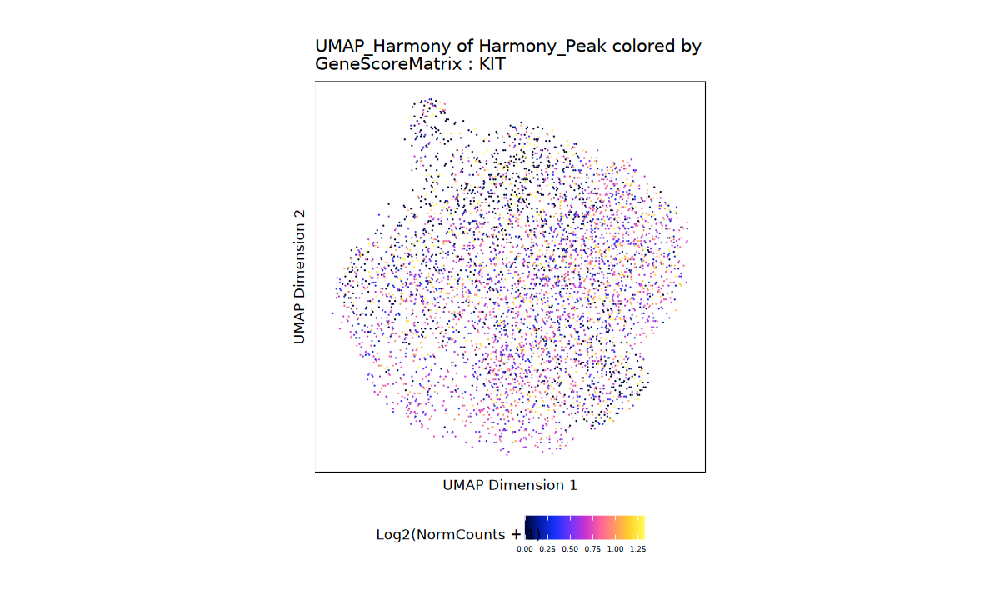

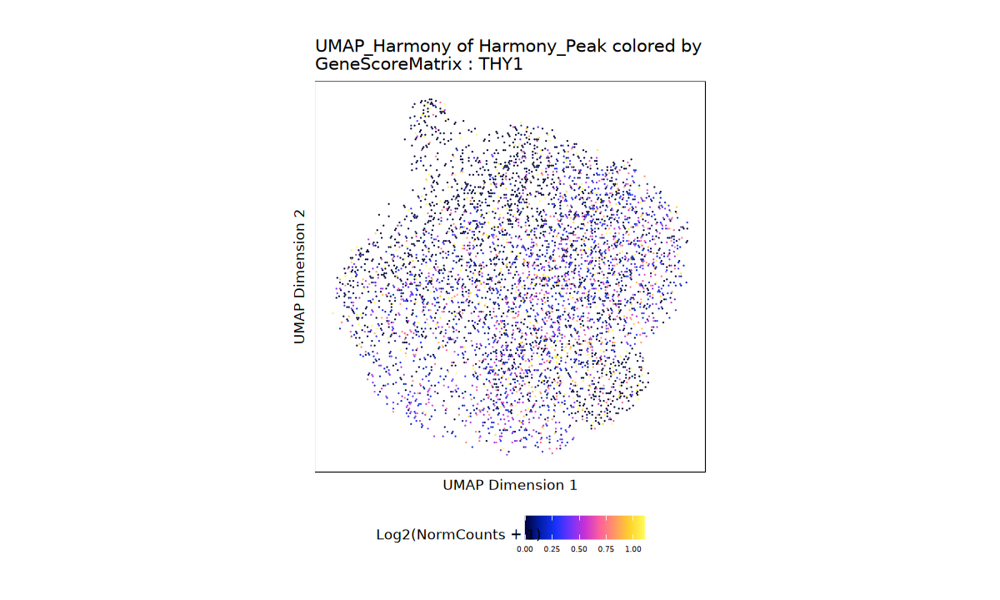

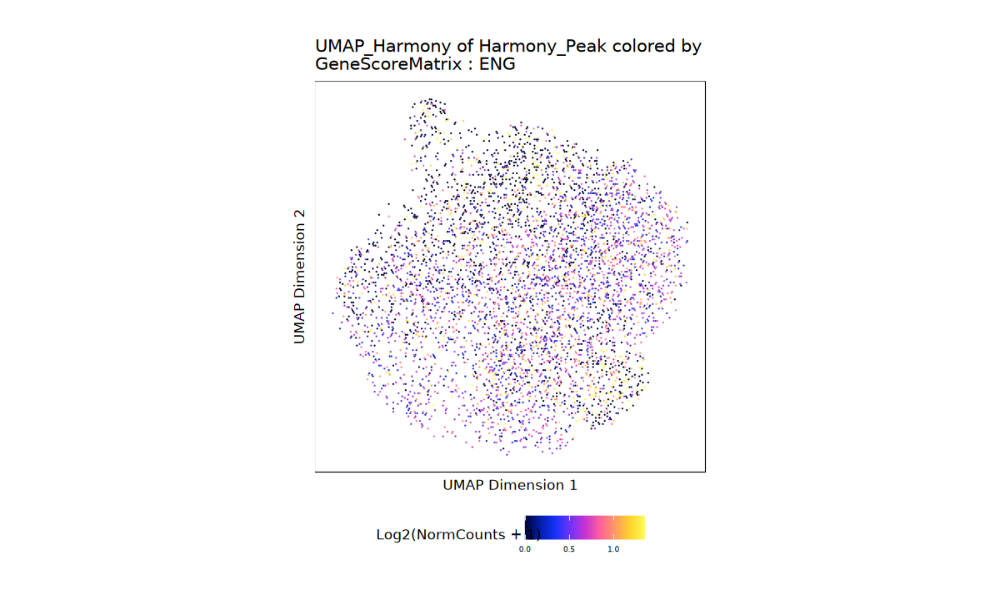

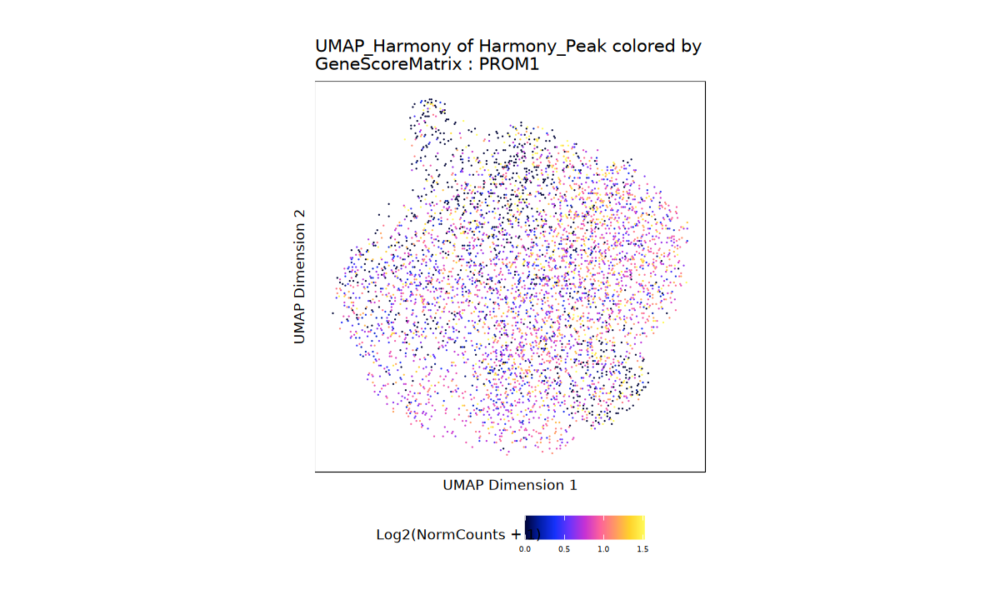

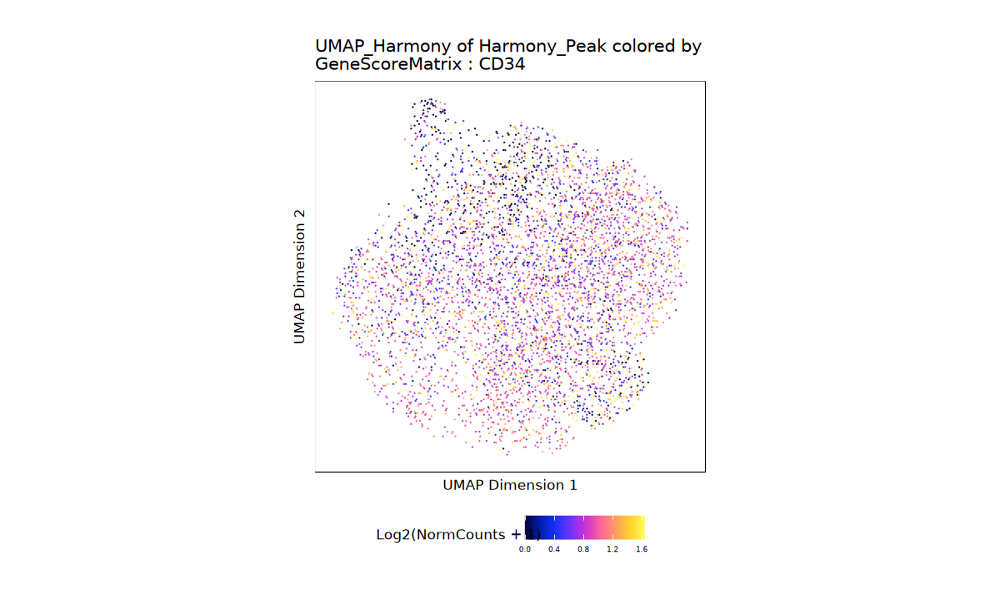

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e73657ba35d5-Date-2025-09-02_Time-11-34-41.286867.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-09-02 11:34:42.672724 : 



R_zmq_msg_send errno: 4 strerror: Unterbrechung während des Betriebssystemaufrufs




Plotting Embedding

1 
2 
3 
4 
5 
6 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e73657ba35d5-Date-2025-09-02_Time-11-34-41.286867.log



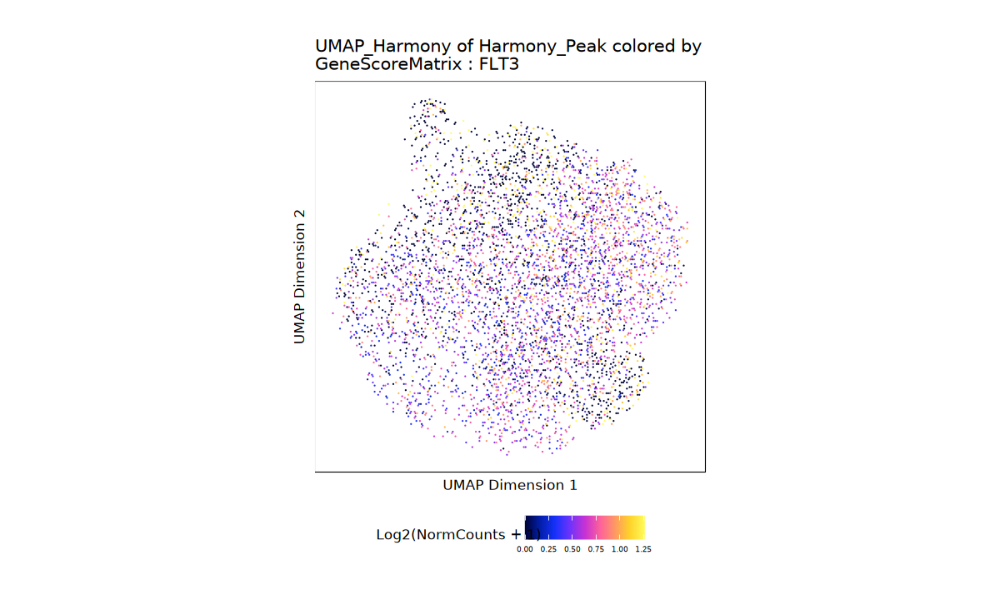

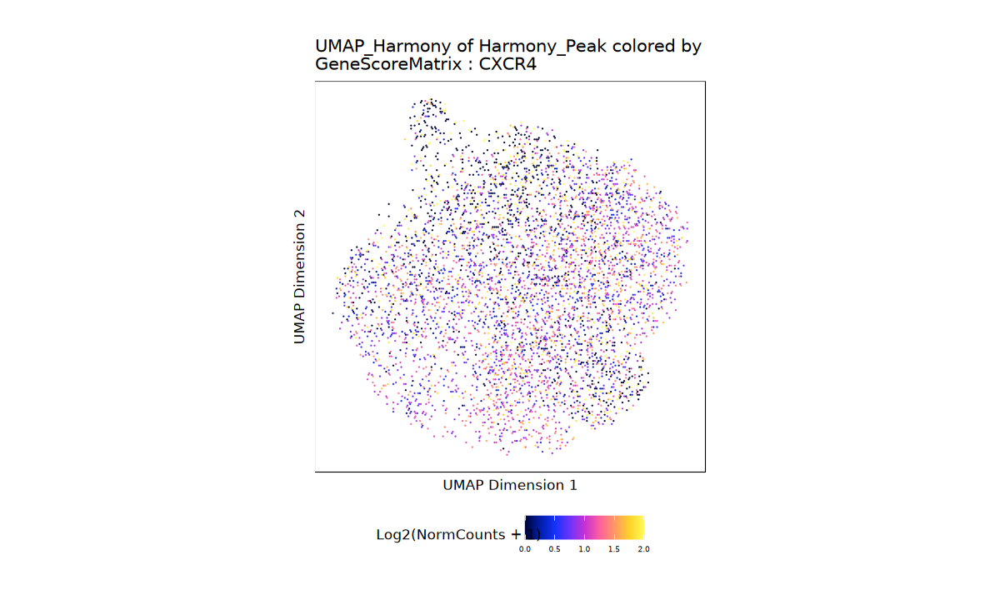

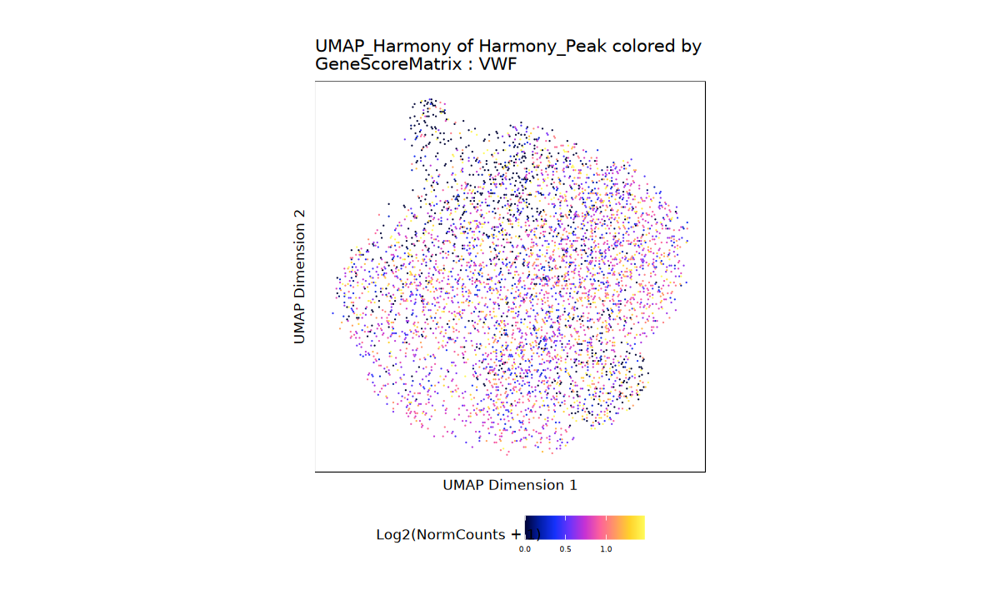

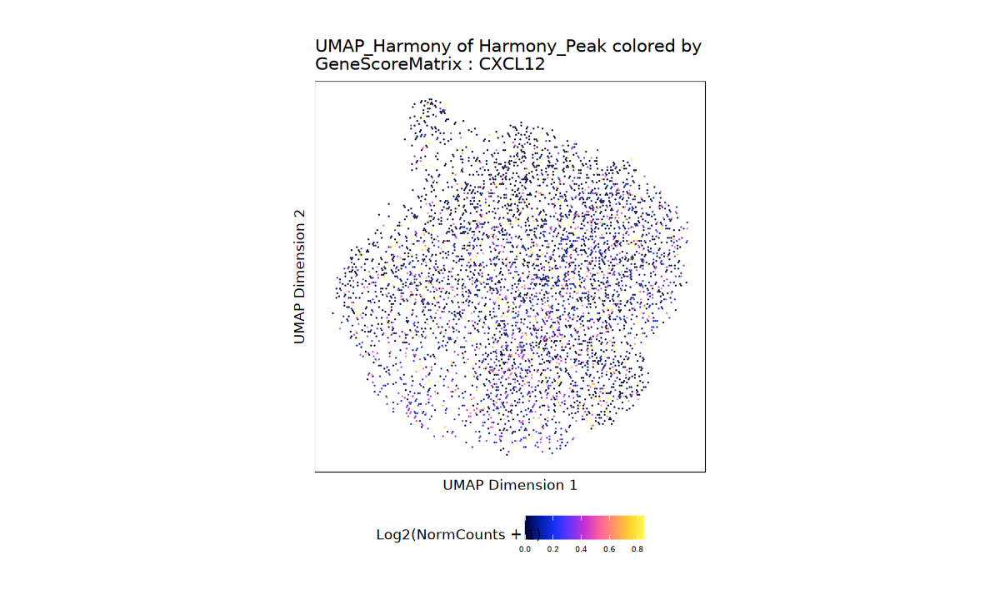

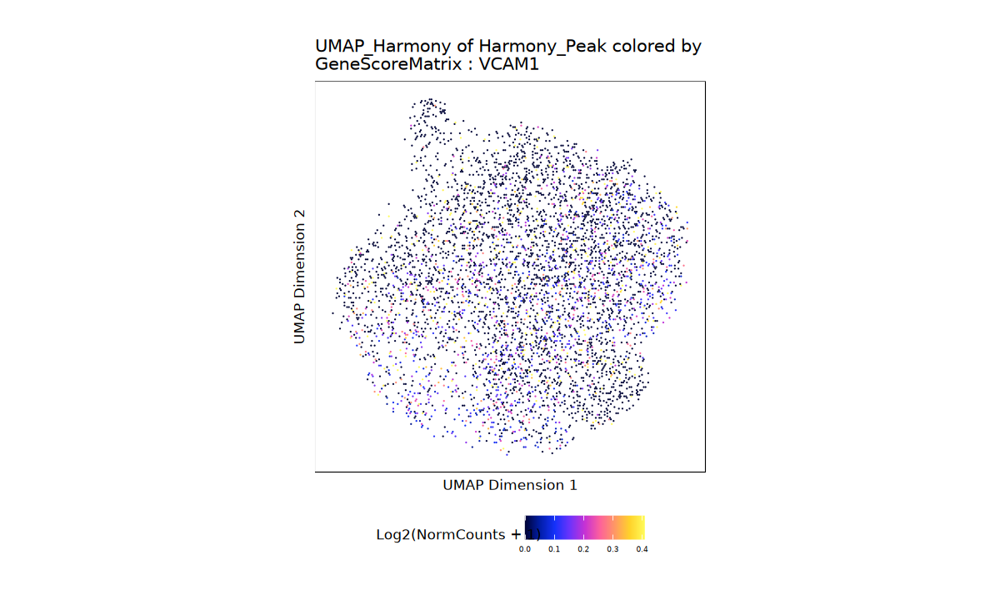

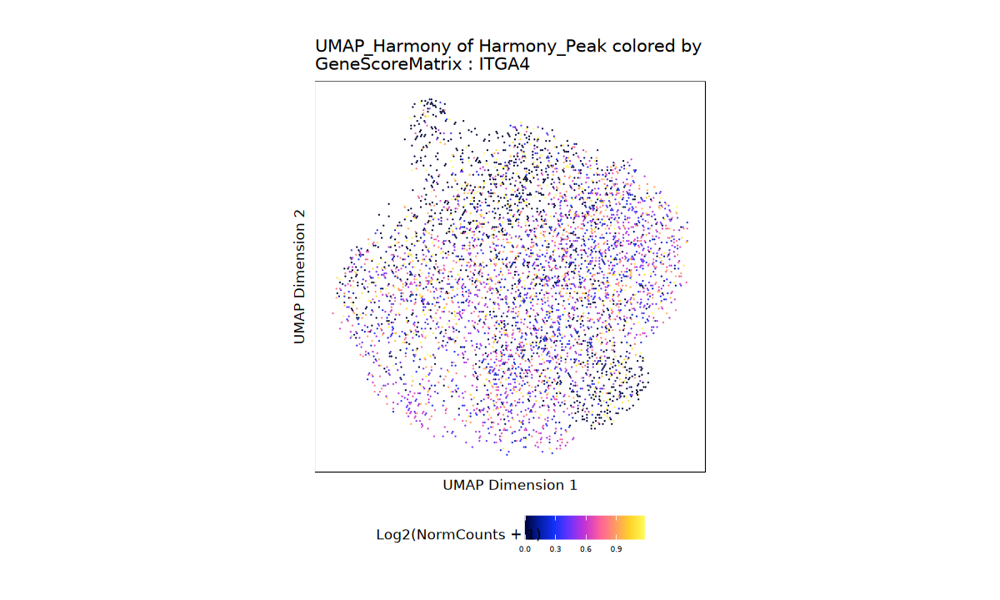

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e7361bd201b6-Date-2025-09-02_Time-11-34-56.37787.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-09-02 11:34:57.677308 : 



R_zmq_msg_send errno: 4 strerror: Unterbrechung während des Betriebssystemaufrufs




Plotting Embedding

1 
2 
3 
4 
5 
6 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e7361bd201b6-Date-2025-09-02_Time-11-34-56.37787.log



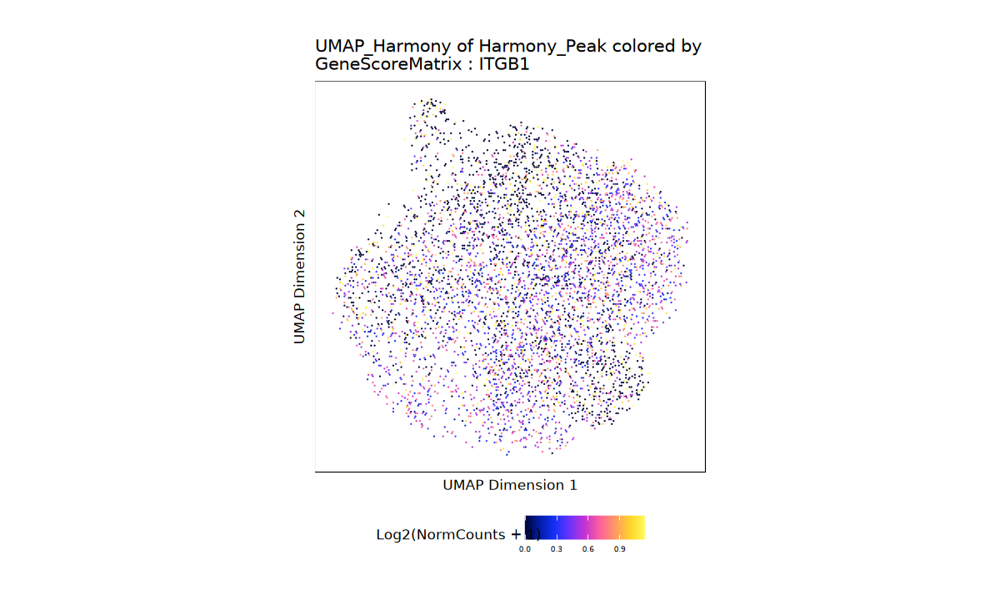

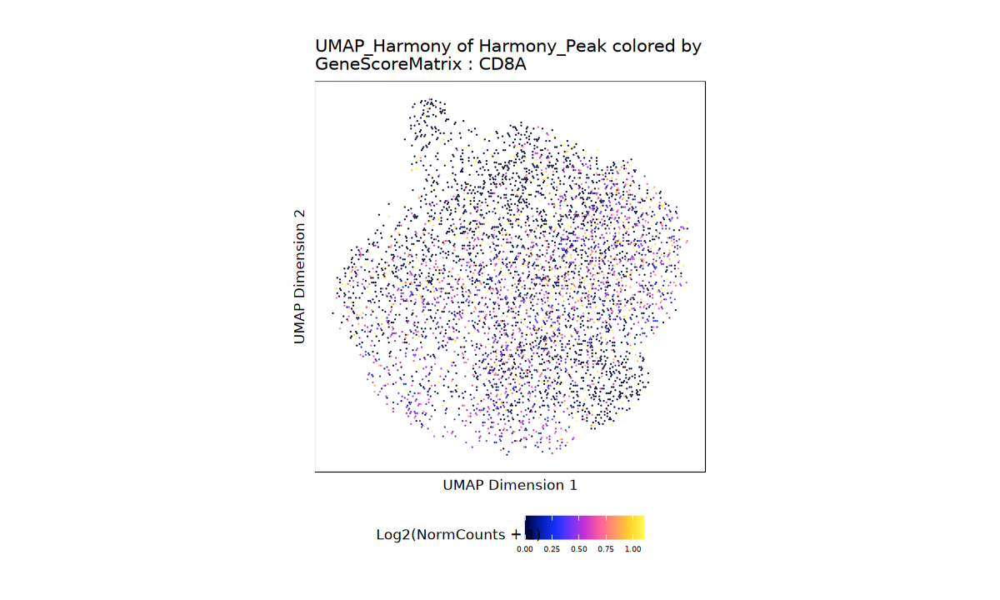

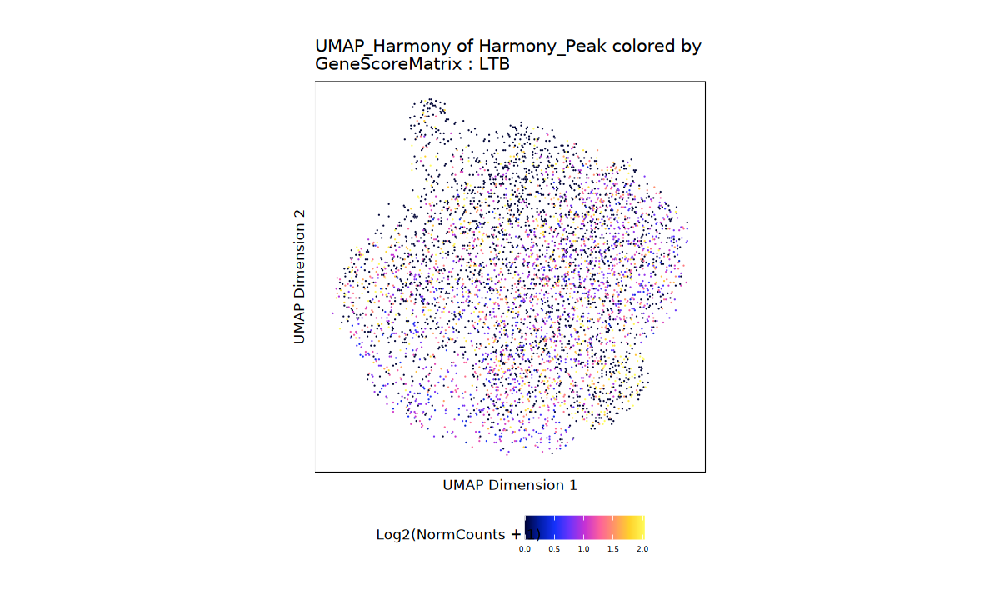

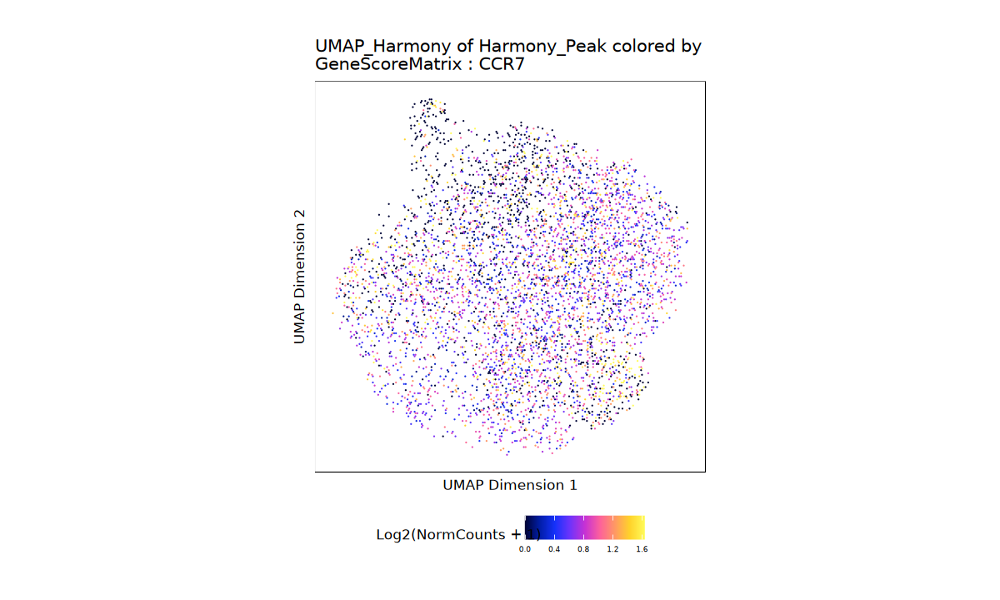

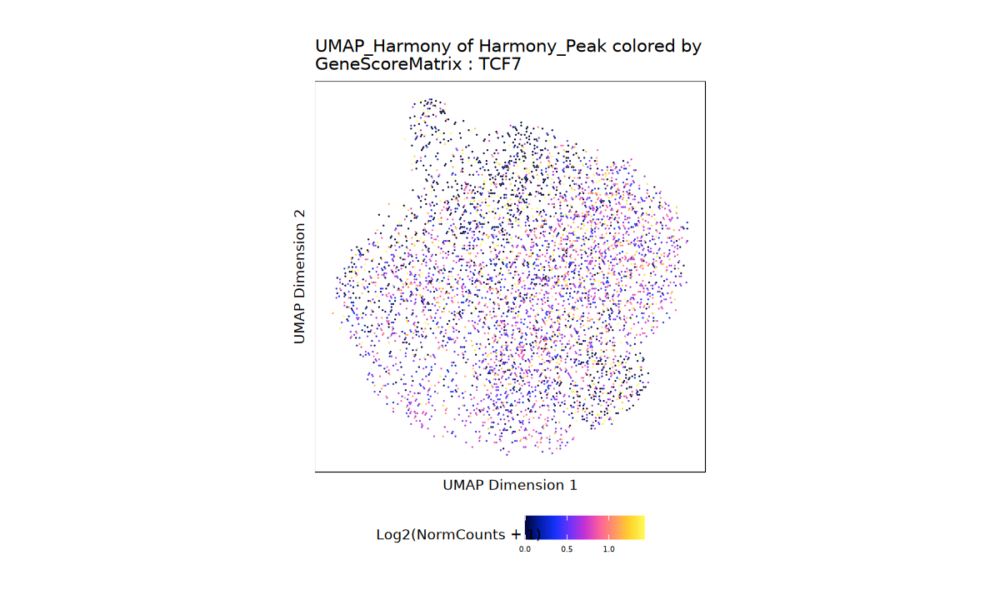

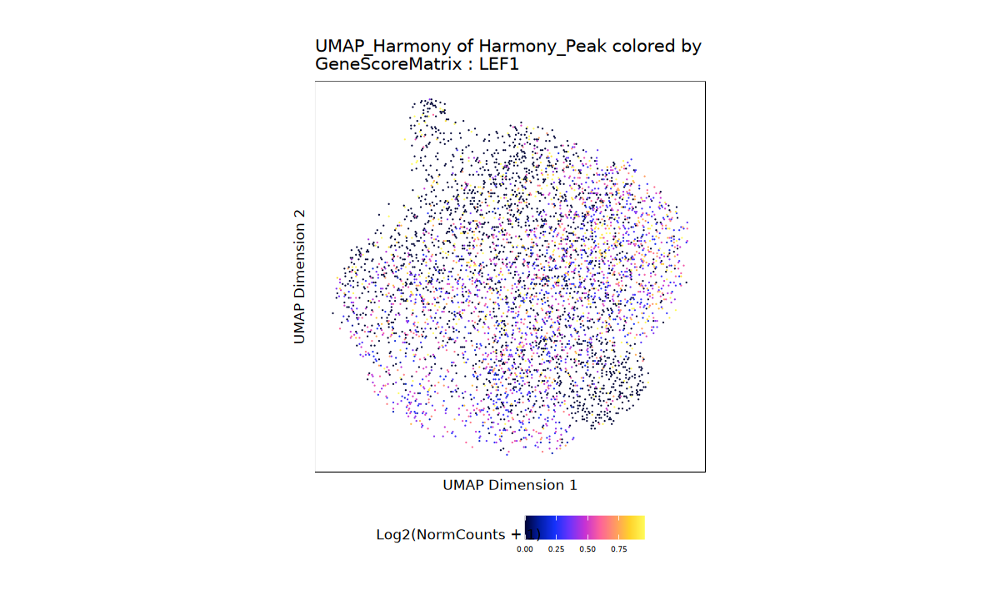

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e73613f9f83b-Date-2025-09-02_Time-11-35-15.253783.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-09-02 11:35:16.689594 : 



Plotting Embedding

1 
2 
3 
4 
5 
6 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e73613f9f83b-Date-2025-09-02_Time-11-35-15.253783.log



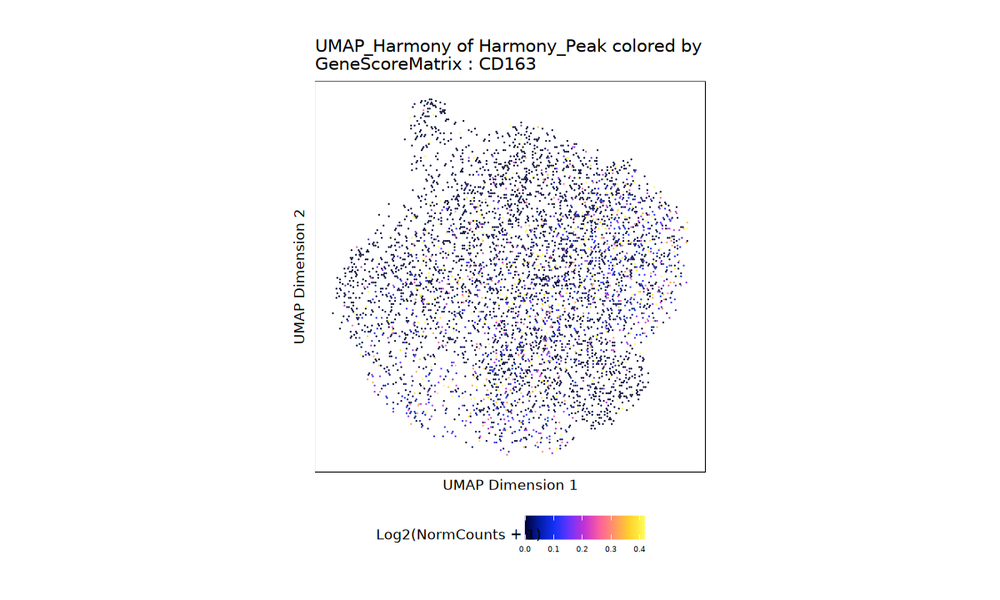

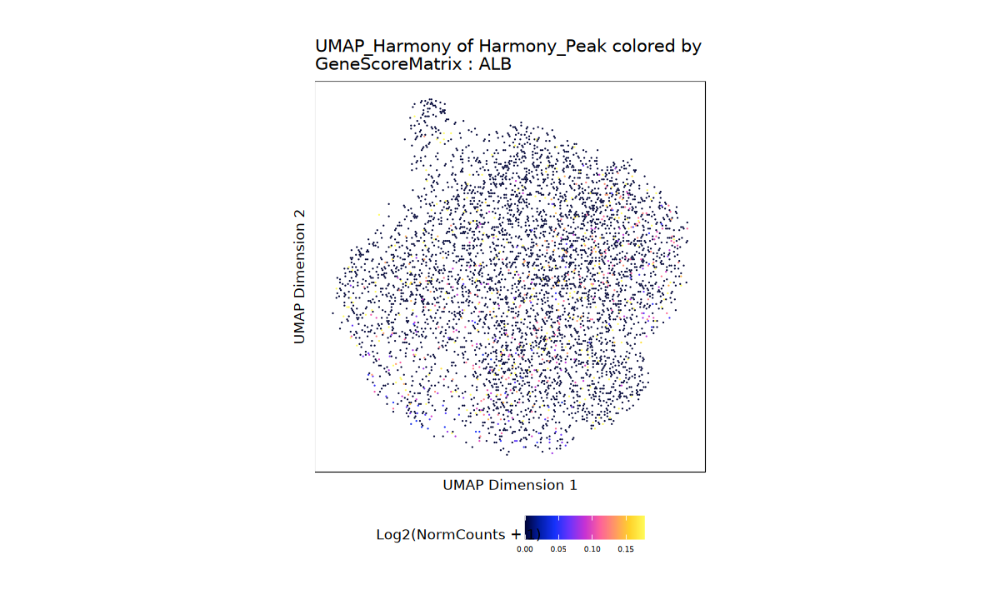

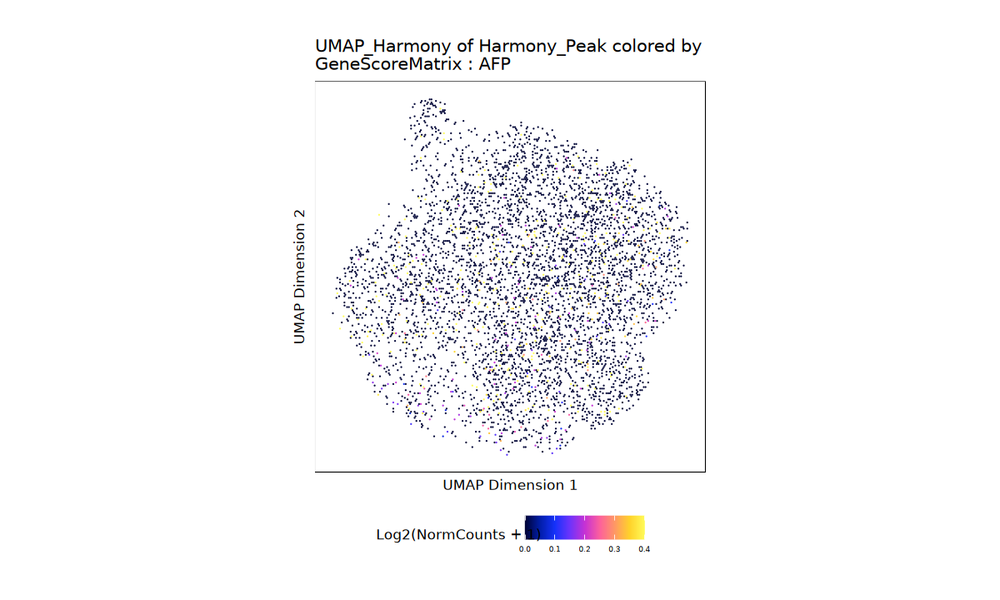

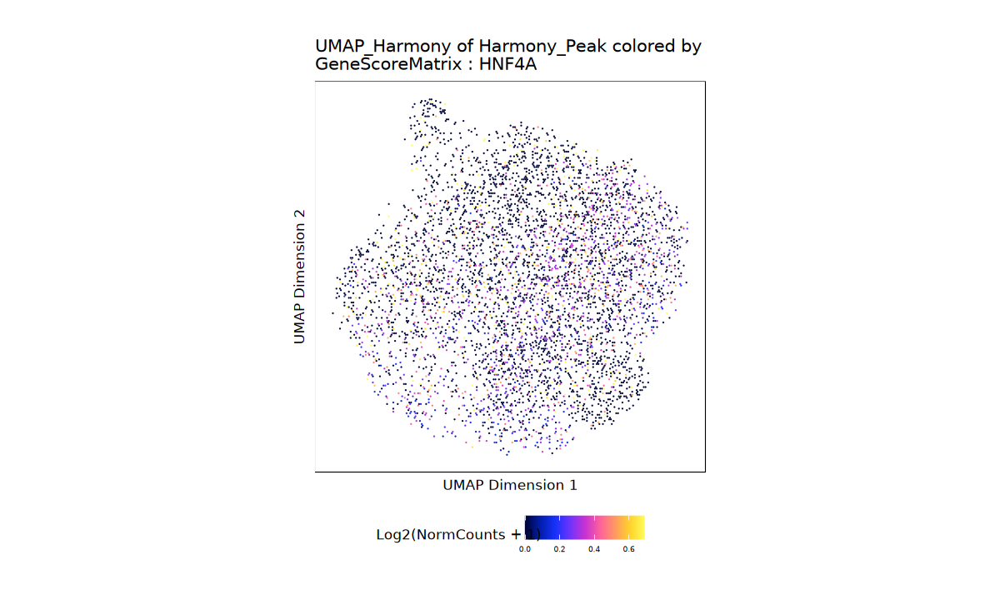

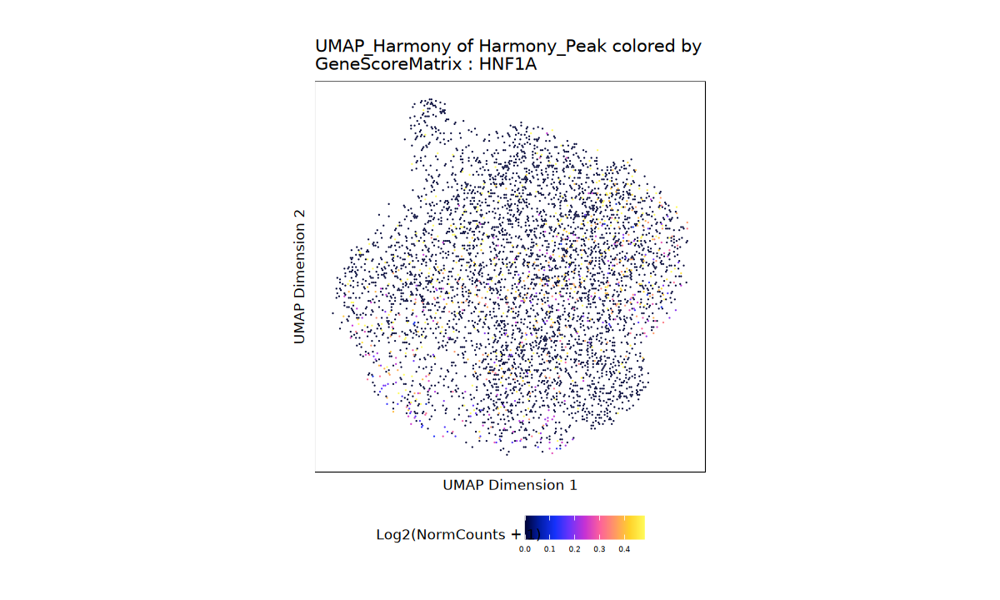

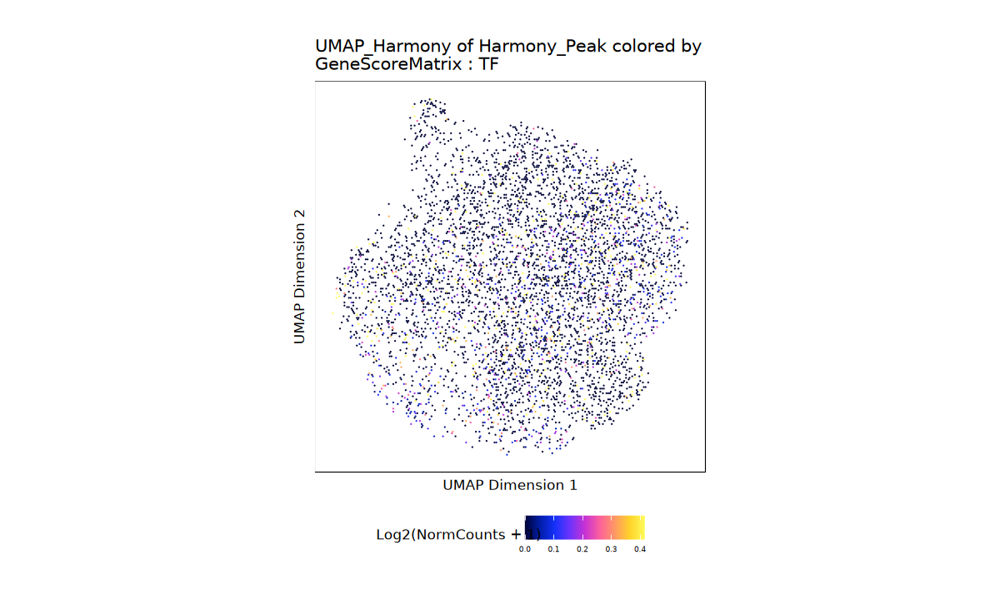

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e73670364e59-Date-2025-09-02_Time-11-35-33.021788.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-09-02 11:35:35.728201 : 



R_zmq_msg_send errno: 4 strerror: Unterbrechung während des Betriebssystemaufrufs




Plotting Embedding

1 
2 
3 
4 
5 
6 
7 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e73670364e59-Date-2025-09-02_Time-11-35-33.021788.log



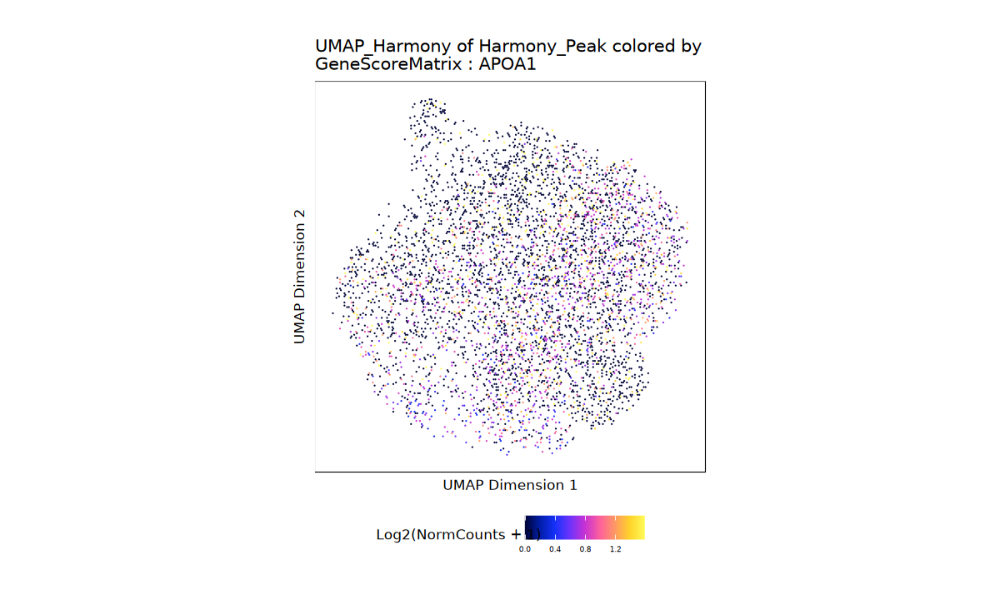

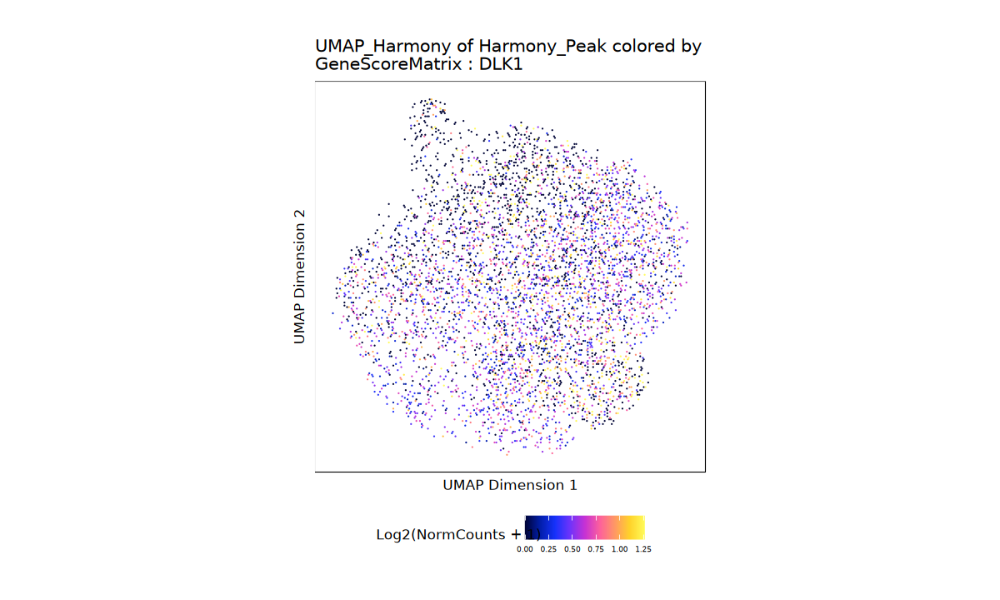

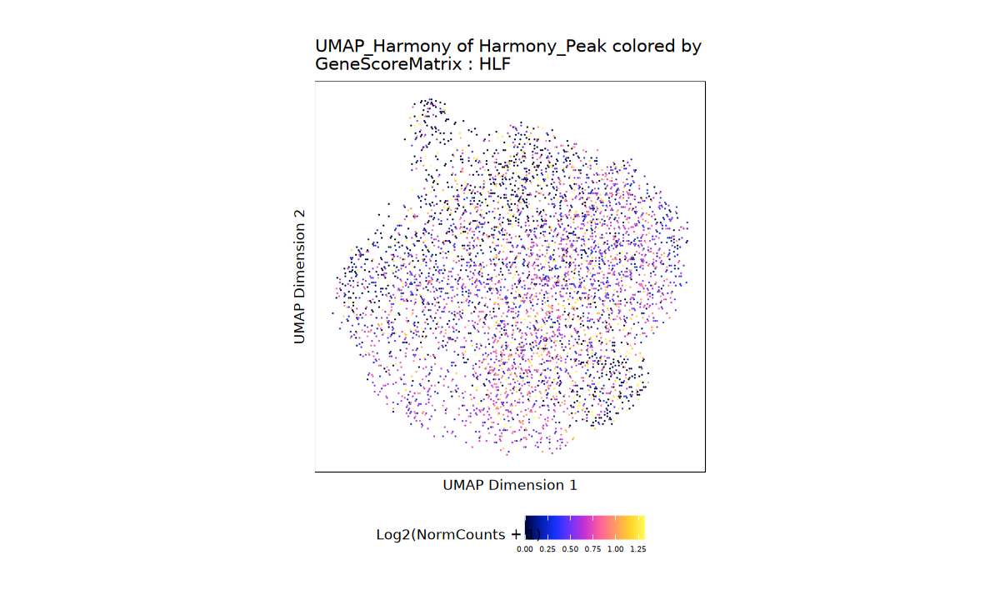

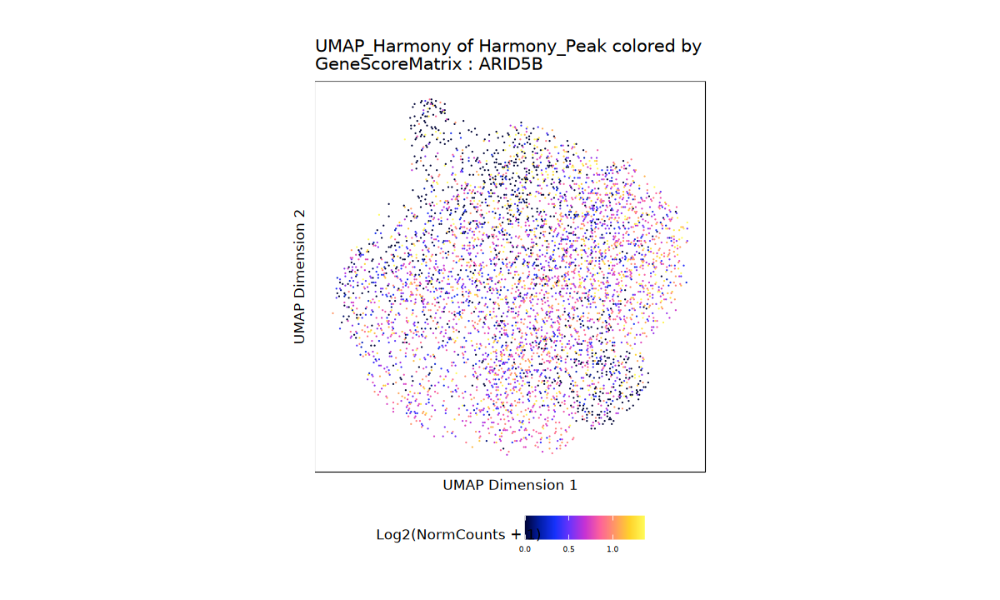

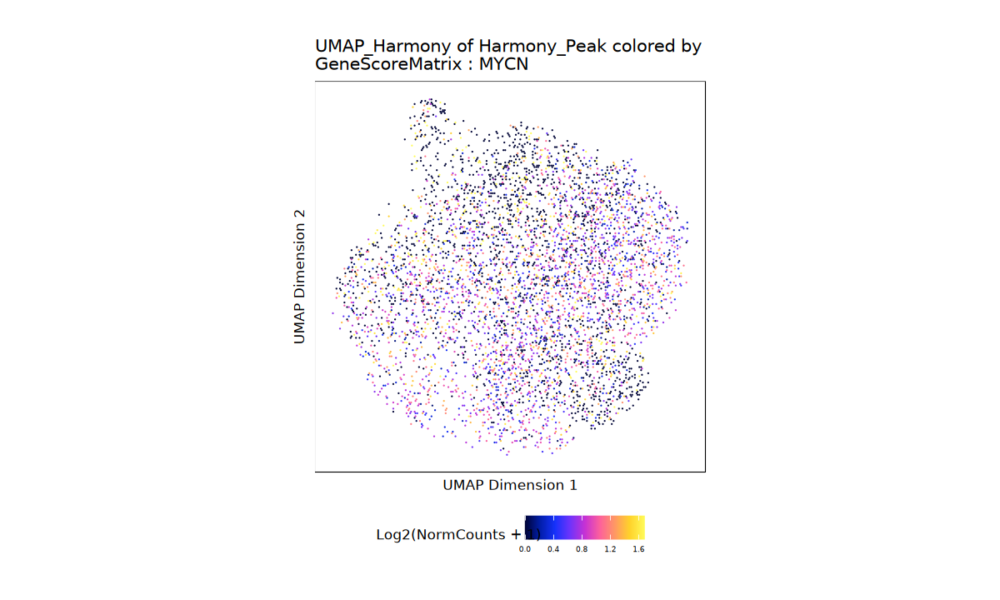

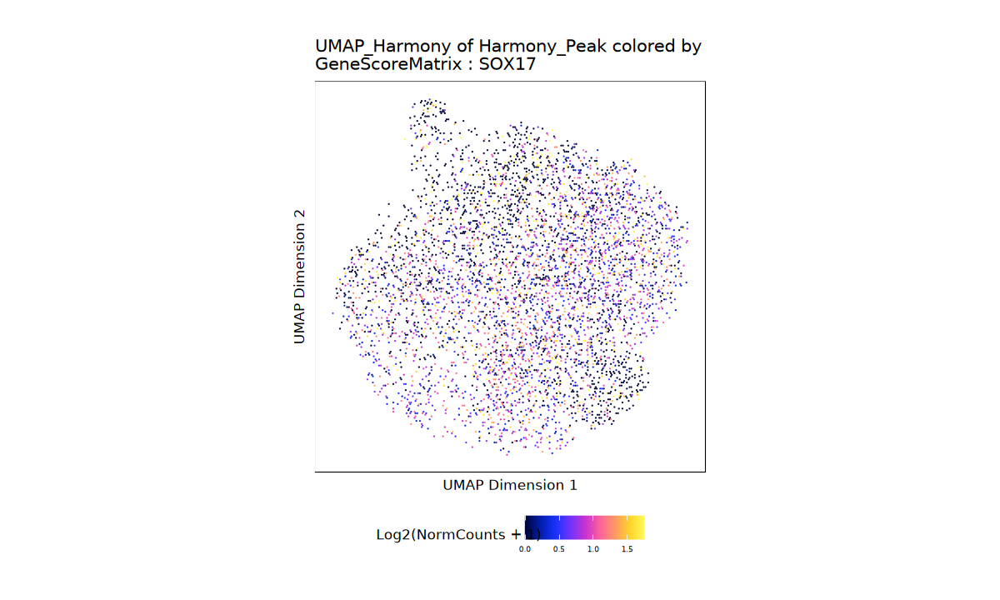

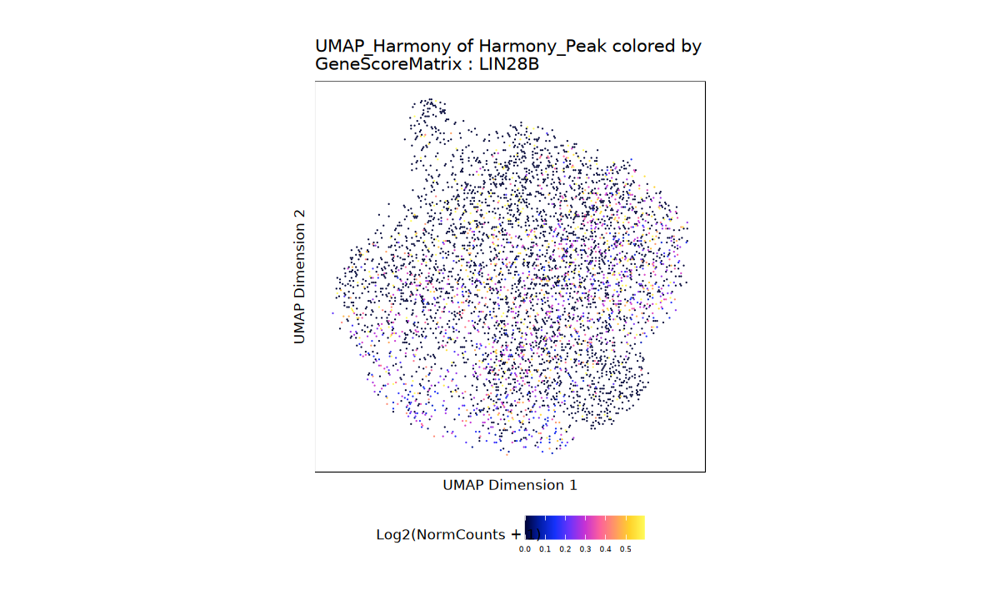

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e73643b9de33-Date-2025-09-02_Time-11-36-08.179209.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-09-02 11:36:09.610412 : 



R_zmq_msg_send errno: 4 strerror: Unterbrechung während des Betriebssystemaufrufs




Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 
12 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e73643b9de33-Date-2025-09-02_Time-11-36-08.179209.log



pdf 
  2

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e7361a3208ea-Date-2025-09-02_Time-11-36-40.283888.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-09-02 11:36:41.646821 : 



R_zmq_msg_send errno: 4 strerror: Unterbrechung während des Betriebssystemaufrufs




Plotting Embedding

1 
2 
3 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e7361a3208ea-Date-2025-09-02_Time-11-36-40.283888.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e736631eaf37-Date-2025-09-02_Time-11-36-50.63166.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-09-02 11:36:51.916903 : 



R_zmq_msg_send errno: 4 strerror: Unterbrechung während des Betriebssystemaufrufs
R_zmq_msg_send errno: 4 strerror: Unterbrechung während des Betriebssystemaufrufs
R_zmq_msg_send errno: 4 strerror: Unterbrechung während des Betriebssystemaufrufs




Plotting Embedding

1 
2 
3 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e736631eaf37-Date-2025-09-02_Time-11-36-50.63166.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e7363887c83f-Date-2025-09-02_Time-11-37-01.336064.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-09-02 11:37:02.683853 : 



R_zmq_msg_send errno: 4 strerror: Unterbrechung während des Betriebssystemaufrufs
R_zmq_msg_send errno: 4 strerror: Unterbrechung während des Betriebssystemaufrufs




Plotting Embedding

1 
2 
3 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e7363887c83f-Date-2025-09-02_Time-11-37-01.336064.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-e736162570a6-Date-2025-09-02_Time-11-37-10.93915.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-09-02 11:37:12.251471 : 



R_zmq_msg_send errno: 4 strerror: Unterbrechung während des Betriebssystemaufrufs
R_zmq_msg_send errno: 4 strerror: Unterbrechung während des Betriebssystemaufrufs




Plotting Embedding

1 
2 
3 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-e736162570a6-Date-2025-09-02_Time-11-37-10.93915.log



pdf 
  2

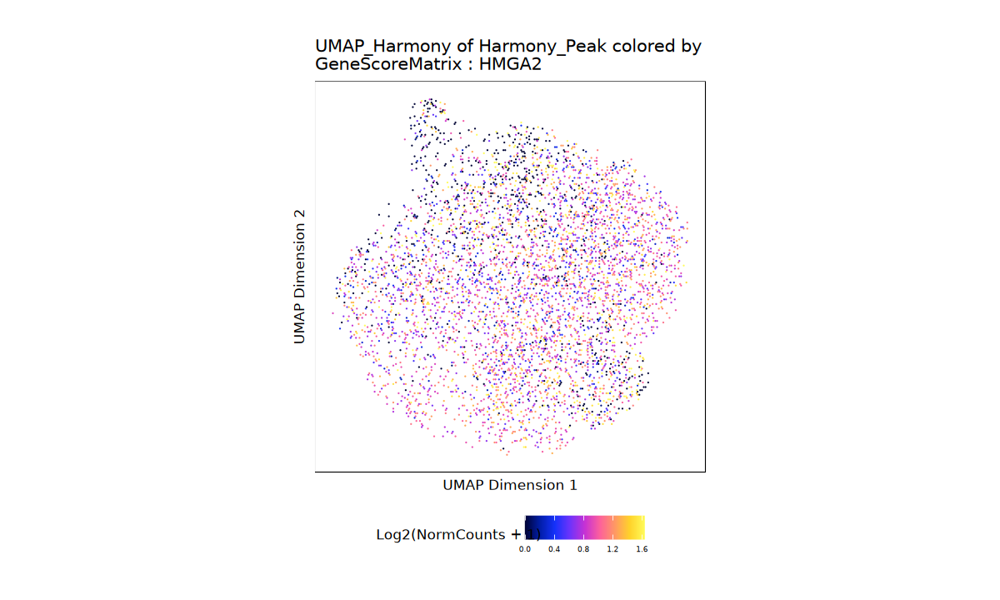

In [61]:
# Differential gene activity between tissues
markerGenes_Tissue <- getMarkerFeatures(
  ArchRProj = proj_hsc,
  useMatrix = "GeneScoreMatrix",
  groupBy = "Tissue",
  testMethod = "wilcoxon",
  bias = c("TSSEnrichment", "log10(nFrags)"),
  useGroups = "MobilizedBlood",
  bgdGroups = "BoneMarrow"
)

# Define gene sets including liver markers
hsc_genes <- c("KIT", "THY1", "ENG", "PROM1", "CD34", "FLT3")
mobilization_genes <- c("CXCR4", "VWF", "CXCL12", "VCAM1", "ITGA4", "ITGB1")
spleen_genes <- c("CD8A", "LTB", "CCR7", "TCF7", "LEF1", "CD163")

# Liver-specific genes
liver_genes <- c(
  # Hepatocyte markers
  "ALB",      # Albumin - major liver protein
  "AFP",      # Alpha-fetoprotein - fetal liver marker
  "HNF4A",    # Hepatocyte nuclear factor 4 alpha
  "HNF1A",    # Hepatocyte nuclear factor 1 alpha
  "TF",       # Transferrin
  "APOA1",    # Apolipoprotein A1
  
  # Liver sinusoidal endothelial cells (LSECs)
  "CLEC4G",   # C-type lectin domain family 4 member G (liver-specific)
  "STAB1",    # Stabilin-1
  "STAB2",    # Stabilin-2
  "FCGR2B",   # Fc gamma receptor 2B
  
  # Kupffer cells (liver macrophages)
  "CLEC4F",   # C-type lectin domain family 4 member F (Kupffer cell specific)
  "MARCO",    # Macrophage receptor with collagenous structure
  "TIMD4",    # T-cell immunoglobulin and mucin domain 4
  
  # Liver stem/progenitor markers
  "EPCAM",    # Epithelial cell adhesion molecule
  "KRT19",    # Keratin 19
  "SOX9",     # SRY-box 9
  "LGR5",     # Leucine-rich repeat-containing G-protein coupled receptor 5
  
  # Liver metabolism markers
  "CYP3A4",   # Cytochrome P450 3A4
  "CYP2E1",   # Cytochrome P450 2E1
  "G6PC",     # Glucose-6-phosphatase
  "PCK1"      # Phosphoenolpyruvate carboxykinase 1
)

# Additional fetal liver hematopoiesis markers
fetal_liver_hsc_genes <- c(
  "DLK1",     # Delta-like 1 homolog - fetal liver HSC marker
  "HLF",      # Hepatic leukemia factor
  "ARID5B",   # AT-rich interaction domain 5B
  "MYCN",     # N-myc proto-oncogene
  "SOX17",    # SRY-box 17 - fetal HSC marker
  "LIN28B",   # Lin-28 homolog B - fetal-specific
  "HMGA2"     # High mobility group AT-hook 2 - fetal HSC
)

# Check which genes are present
all_genes <- getFeatures(proj_hsc, useMatrix = "GeneScoreMatrix")

check_gene_presence <- function(gene_list, list_name) {
  present <- gene_list[gene_list %in% all_genes]
  missing <- gene_list[!gene_list %in% all_genes]
  cat("\n", list_name, ":\n")
  cat("  Present (", length(present), "/", length(gene_list), "): ", 
      paste(present, collapse = ", "), "\n")
  if(length(missing) > 0) {
    cat("  Missing: ", paste(missing, collapse = ", "), "\n")
  }
  return(present)
}

hsc_genes_present <- check_gene_presence(hsc_genes, "HSC genes")
mobilization_genes_present <- check_gene_presence(mobilization_genes, "Mobilization genes")
spleen_genes_present <- check_gene_presence(spleen_genes, "Spleen genes")
liver_genes_present <- check_gene_presence(liver_genes, "Liver genes")
fetal_liver_genes_present <- check_gene_presence(fetal_liver_hsc_genes, "Fetal liver HSC genes")

# Plot gene activity for all gene sets
plot_gene_set <- function(proj, genes, title, ncol = 3) {
  if(length(genes) == 0) {
    cat("No genes to plot for", title, "\n")
    return(NULL)
  }
  
  p <- plotEmbedding(
    ArchRProj = proj,
    colorBy = "GeneScoreMatrix",
    name = genes,
    embedding = "UMAP_Harmony",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL
  )
  
  # Display in console
  cat("\nPlotting", title, ":\n")
  for(i in seq_along(p)) {
    print(p[[i]])
  }
  
  return(p)
}

# Generate plots
p_hsc <- plot_gene_set(proj_hsc, hsc_genes_present, "HSC markers")
p_mob <- plot_gene_set(proj_hsc, mobilization_genes_present, "Mobilization genes")
p_spleen <- plot_gene_set(proj_hsc, spleen_genes_present, "Spleen genes")
p_liver <- plot_gene_set(proj_hsc, liver_genes_present[1:min(6, length(liver_genes_present))], "Liver genes (top 6)")
p_fetal <- plot_gene_set(proj_hsc, fetal_liver_genes_present, "Fetal liver HSC genes")

# Save PDF with all gene sets
pdf("Gene_Activity_All_Organs.pdf", width = 16, height = 12)

# HSC markers
if(length(p_hsc) > 0) {
  print(cowplot::plot_grid(plotlist = p_hsc[1:min(6, length(p_hsc))], 
                          ncol = 3, labels = hsc_genes_present[1:min(6, length(p_hsc))]))
}

# Mobilization genes
if(length(p_mob) > 0) {
  print(cowplot::plot_grid(plotlist = p_mob[1:min(6, length(p_mob))], 
                          ncol = 3, labels = mobilization_genes_present[1:min(6, length(p_mob))]))
}

# Spleen genes
if(length(p_spleen) > 0) {
  print(cowplot::plot_grid(plotlist = p_spleen[1:min(6, length(p_spleen))], 
                          ncol = 3, labels = spleen_genes_present[1:min(6, length(p_spleen))]))
}

# Liver genes
if(length(liver_genes_present) > 0) {
  p_liver_all <- plotEmbedding(
    ArchRProj = proj_hsc,
    colorBy = "GeneScoreMatrix",
    name = liver_genes_present[1:min(12, length(liver_genes_present))],
    embedding = "UMAP_Harmony",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL
  )
  print(cowplot::plot_grid(plotlist = p_liver_all[1:min(12, length(p_liver_all))], 
                          ncol = 3, labels = liver_genes_present[1:min(12, length(p_liver_all))]))
}

# Fetal liver HSC genes
if(length(p_fetal) > 0) {
  print(cowplot::plot_grid(plotlist = p_fetal[1:min(6, length(p_fetal))], 
                          ncol = 3, labels = fetal_liver_genes_present[1:min(6, length(p_fetal))]))
}

dev.off()

# Create a focused comparison plot for organ-specific signatures
key_organ_genes <- list(
  BoneMarrow = c("CXCL12", "KITLG", "VCAM1"),
  Spleen = c("CD8A", "CCR7", "LTB"),
  Liver = c("ALB", "AFP", "HNF4A"),
  FetalLiver = c("DLK1", "SOX17", "LIN28B")
)

# Check and plot key genes from each organ
pdf("Organ_Specific_Signatures.pdf", width = 16, height = 12)

for(organ in names(key_organ_genes)) {
  genes_to_plot <- key_organ_genes[[organ]][key_organ_genes[[organ]] %in% all_genes]
  
  if(length(genes_to_plot) > 0) {
    p_organ <- plotEmbedding(
      ArchRProj = proj_hsc,
      colorBy = "GeneScoreMatrix",
      name = genes_to_plot,
      embedding = "UMAP_Harmony",
      quantCut = c(0.01, 0.95),
      imputeWeights = NULL
    )
    
    print(cowplot::plot_grid(plotlist = p_organ, 
                            ncol = length(p_organ), 
                            labels = genes_to_plot,
                            label_size = 10,
                            hjust = 0))
  }
}

dev.off()

In [ ]:
# Specifically test if MB-enriched clusters show different organ signatures
# suggesting mobilization from different sites

mb_enriched_clusters <- c("C2", "C3", "C4", "C8")

# Compare organ signatures between MB-enriched clusters
mb_enriched_data <- score_data[score_data$Cluster %in% mb_enriched_clusters & 
                               score_data$Tissue == "MobilizedBlood", ]

# Perform clustering on organ signatures to identify potential sources
if(nrow(mb_enriched_data) > 0) {
  
  # Create signature matrix
  sig_matrix <- as.matrix(mb_enriched_data[, score_columns])
  rownames(sig_matrix) <- paste(mb_enriched_data$Cluster, 1:nrow(mb_enriched_data), sep = "_")
  
  # Calculate mean signatures per cluster
  cluster_signatures <- aggregate(
    mb_enriched_data[, score_columns],
    by = list(Cluster = mb_enriched_data$Cluster),
    FUN = mean
  )
  
  # Create a radar plot for each MB-enriched cluster
  library(fmsb)
  
  pdf("MB_Cluster_Organ_Signatures.pdf", width = 12, height = 10)
  
  # Prepare data for radar plot
  radar_data <- cluster_signatures[, -1]
  rownames(radar_data) <- cluster_signatures$Cluster
  
  # Normalize to 0-1 scale
  radar_data <- as.data.frame(apply(radar_data, 2, function(x) {
    (x - min(x)) / (max(x) - min(x))
  }))
  
  # Add max and min rows for radar plot
  radar_data <- rbind(rep(1, ncol(radar_data)), 
                     rep(0, ncol(radar_data)), 
                     radar_data)
  
  # Plot radar for each cluster
  colors <- c("#E41A1C", "#377EB8", "#4DAF4A", "#984EA3")
  
  for(i in 3:nrow(radar_data)) {
    radarchart(radar_data[c(1, 2, i), ],
              axistype = 1,
              pcol = colors[i-2],
              pfcol = scales::alpha(colors[i-2], 0.3),
              plwd = 2,
              title = paste("Cluster", rownames(radar_data)[i], "Organ Signatures"))
  }
  
  dev.off()
  
  # Identify potential organ sources
  cat("\nPotential organ sources for MB-enriched clusters:\n")
  for(i in 1:nrow(cluster_signatures)) {
    cluster <- cluster_signatures$Cluster[i]
    scores <- cluster_signatures[i, -1]
    max_score <- names(scores)[which.max(scores)]
    organ <- gsub("Score_", "", max_score)
    
    cat("  Cluster", cluster, ":", organ, 
        "(score =", round(max(scores), 3), ")\n")
    
    # Checks if it's  from spleen or liver
    if(grepl("Spleen|Liver", organ)) {
      cat("    -> Potential non-BM mobilization source detected!\n")
    }
  }
}

In [ ]:
#Unbiased Discovery

In [68]:
markersGS <- getMarkerFeatures(
  ArchRProj     = proj_hsc,
  useMatrix     = "GeneScoreMatrix",
  groupBy       = "Comparison_Group",
  testMethod    = "wilcoxon",
  bias          = c("TSSEnrichment", "log10(nFrags)"), 
  useGroups     = c("BM_enriched", "MB_enriched"), 
  bgdGroups     = "Mixed"                
)


ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-e73634e7b1fc-Date-2025-09-02_Time-12-20-42.429038.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Double.Matrix

2025-09-02 12:20:43.815084 : Matching Known Biases, 0.008 mins elapsed.



In [ ]:
markerList <- getMarkers(markersGS, cutOff = "FDR <= 0.05 & Log2FC >= 1")

In [69]:
# collapse to: C1, C2, C4, C7, Mixed
enriched_keep <- c("C1","C2","C4","C7")
proj_hsc$Cluster_Collapsed <- ifelse(
  proj_hsc$Clusters_Harmony %in% enriched_keep,
  proj_hsc$Clusters_Harmony,
  "Mixed"
)
proj_hsc$Cluster_Collapsed <- factor(
  proj_hsc$Cluster_Collapsed,
  levels = c("C1","C2","C4","C7","Mixed")
)

# quick sanity check
table(proj_hsc$Cluster_Collapsed)



   C1    C2    C4    C7 Mixed 
  423   425  1293   123  2800 

In [77]:
# cell counts per group and per sample
table(proj_hsc$Clusters_Harmony, proj_hsc$Sample)

# Drops tiny groups to avoid unstable tests
cells_per_group <- table(proj_hsc$Clusters_Harmony)
small_groups <- names(cells_per_group[cells_per_group < 100])
small_groups


    
     collab_0 collab_1 granja_D7T1 granja_D8T1 granja_D9T1
  C1        7        3         115         119         179
  C2      211      175          15          13          11
  C3      384      427          16          42          58
  C4      587      613          21          19          53
  C5      144       89          32          75          96
  C6      201      231          45          61          73
  C7        0        0         103           9          11
  C8      380      310          57          26          53

character(0)

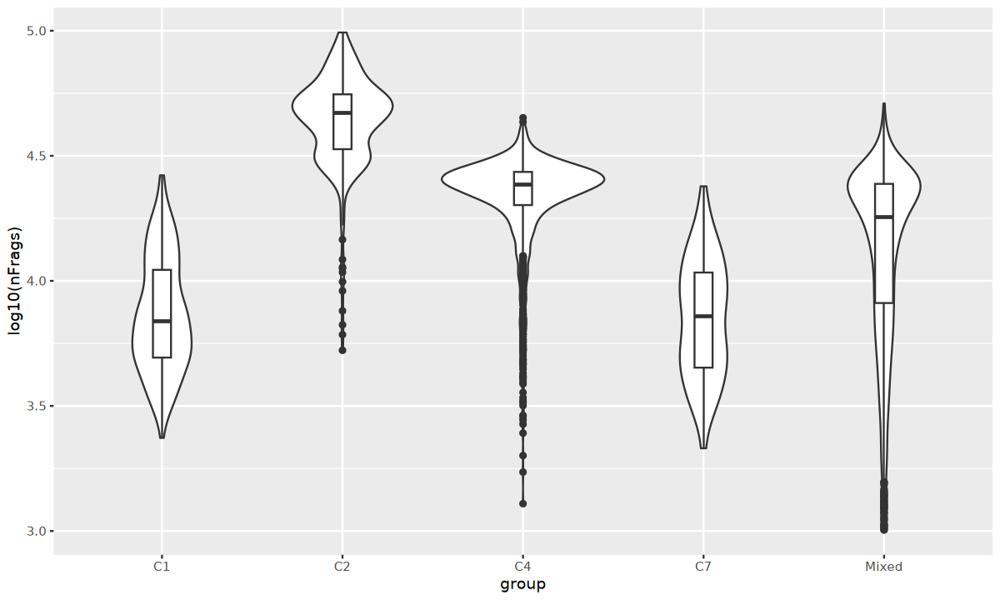

C1 SMD log10(nFrags): -0.882  SMD TSSE: 0.71 
C2 SMD log10(nFrags): 1.861  SMD TSSE: -0.717 
C4 SMD log10(nFrags): 0.727  SMD TSSE: -0.795 
C7 SMD log10(nFrags): -0.921  SMD TSSE: 0.894 


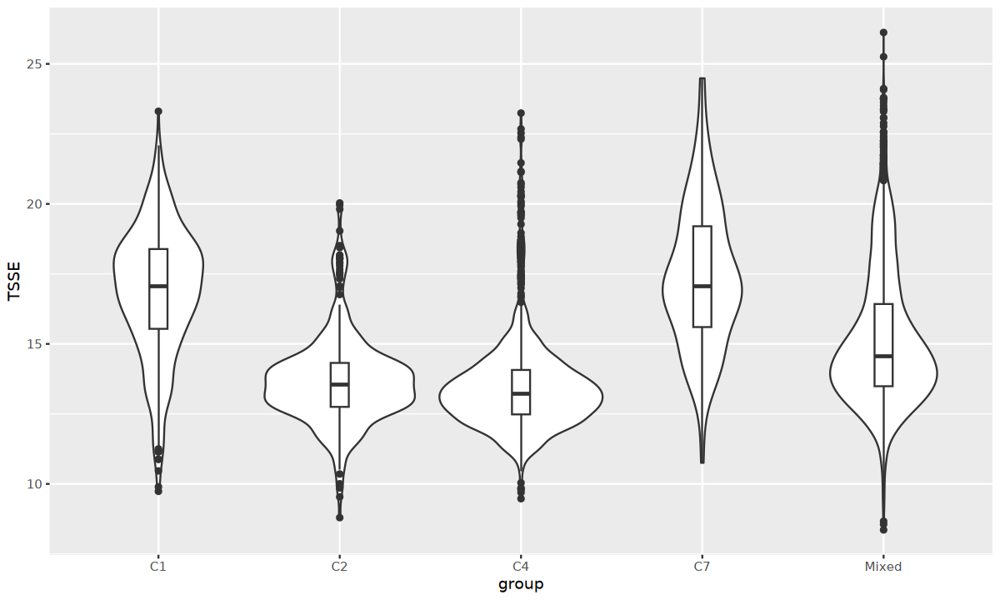

In [80]:
# Depth & TSS distributions per group
library(ggplot2)

df <- data.frame(
  group = proj_hsc$Cluster_Collapsed,
  nFrags = getCellColData(proj_hsc, "nFrags")$nFrags,
  TSSE   = getCellColData(proj_hsc, "TSSEnrichment")$TSSEnrichment
)

ggplot(df, aes(x = group, y = log10(nFrags))) + geom_violin() + geom_boxplot(width=0.1)
ggplot(df, aes(x = group, y = TSSE)) + geom_violin() + geom_boxplot(width=0.1)

# Standardized mean difference (SMD) case vs Mixed
smd <- function(x_case, x_bg) {
  m1 <- mean(x_case, na.rm=TRUE); m0 <- mean(x_bg, na.rm=TRUE)
  s  <- sqrt((var(x_case, na.rm=TRUE) + var(x_bg, na.rm=TRUE))/2)
  (m1 - m0) / s
}
for (g in c("C1","C2","C4","C7")) {
  idx_case <- proj_hsc$Cluster_Collapsed == g
  idx_bg   <- proj_hsc$Cluster_Collapsed == "Mixed"
  cat(g, "SMD log10(nFrags):", round(smd(log10(df$nFrags[idx_case]), log10(df$nFrags[idx_bg])), 3),
      " SMD TSSE:", round(smd(df$TSSE[idx_case], df$TSSE[idx_bg]), 3), "\n")
}
